In [2]:
!pip install pgeocode
!pip install pingouin
!conda install -c pyviz hvplot -y
!conda install -y --channel conda-forge geopandas
!conda install -c conda-forge fiona -y



Solving environment: done

## Package Plan ##

  environment location: /home/bestname/anaconda3

  added / updated specs:
    - hvplot


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2022.12.7          |   py38h06a4308_0         150 KB
    ------------------------------------------------------------
                                           Total:         150 KB

The following packages will be UPDATED:

  certifi                          2022.9.24-py38h06a4308_0 --> 2022.12.7-py38h06a4308_0



certifi-2022.12.7    | 150 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Retrieving notices: ...working... done
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.14.0
  latest version: 22.11.1

Please update conda by running

    $ conda update -n b

In [3]:
import os


os.environ["DASK_TEMPORARY_DIRECTORY"] = "tmp/dask"
os.environ["PGEOCODE_DATA_DIR"] = "tmp/pgeocode_data"
if not os.path.exists("tmp"):
    os.mkdir("tmp")
if not os.path.exists("tmp/dask"):
    os.mkdir("tmp/dask")
if not os.path.exists("tmp/pgeocode_data"):
    os.mkdir("tmp/pgeocode_data")
import pandas as pd
import hvplot.pandas
import dask
import hvplot.dask
import dask.dataframe as dd
import json
import tqdm
from scipy.spatial.distance import cdist
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
import pingouin as pg
import pgeocode as geo
import geopandas as gpd
import fiona
import panel as pn
pn.extension(comms="vscode")
from scipy.stats import entropy


In [4]:
!ls data_dpg_testdata/reduced/ 

mapping_article_files.json
mapping_city.json
mapping_geo.json
mapping_refferer.json
mapping_view_files.json
reduced_articles_df_article.csv
reduced_articles_df_external_categories.csv
reduced_articles_df_external_entities.csv
reduced_articles_df_external_topics.csv
reduced_articles_df_fixed_set_sensitive.csv
reduced_articles_df_fixed_set_topics.csv
reduced_articles_df_fixed_set_userneeds.csv
reduced_articles_df_internal_topics.csv
reduced_interactions.csv
reduced_views.csv


In [5]:
DATA_FOLDER = "reduced"

In [6]:
ddf_views = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER}/reduced_views.csv', dtype={
       'GEO_ZIPCODE': object,
       'REFR_MEDIUM': object, 'IS_LOGGED_IN': object, 'file_name': object,
       "privacy_advertising":int,       
       "privacy_analytics":int,       
       "privacy_functional":int,       
       "privacy_geo_location":int,       
       "privacy_marketing":int,       
       "privacy_non-personalised_ads":int,       
       "privacy_personalisation":int,       
       "privacy_social_media":int,       
       "privacy_target_advertising":int,       
       'ARTICLE_ID':"str",
       })
ddf_views["article_id"] = ddf_views["ARTICLE_ID"]
# ddf_views = ddf_views.drop(["ARTICLE_ID"] , axis=1)
ddf_views["DERIVED_TSTAMP"] = dd.to_datetime(ddf_views["DERIVED_TSTAMP"])
ddf_views["dt_hour"] = ddf_views["DERIVED_TSTAMP"].dt.hour
ddf_views["dt_weekday"] = ddf_views["DERIVED_TSTAMP"].dt.weekday
ddf_views["dt_dayofmonth"] = ddf_views["DERIVED_TSTAMP"].dt.day
ddf_views["dt_month"] = ddf_views["DERIVED_TSTAMP"].dt.month
ddf_views = ddf_views.replace("nu.web.advertorial", "nu.web")
ddf_views_unidentified = ddf_views[ddf_views["QUASI_USER_ID"].isna()].copy()
ddf_views = ddf_views[~ddf_views["QUASI_USER_ID"].isna()]
device_counts = ddf_views["APP_ID"].value_counts().compute()
# sample_amount = (device_counts.min()//100000)*100000
sample_amount = device_counts.min()
# sample_amount = 1000000
unique_devices = device_counts.index.unique()
columns_privacy = list(ddf_views.columns[ddf_views.columns.str.startswith("privacy_")].values)
columns_time = ["hour", "weekday", "dayofmonth", "month"]
ddf_views = ddf_views.groupby('APP_ID').apply(lambda df: df.sample(sample_amount if len(df) else 0) , meta=ddf_views.partitions[0]).reset_index(drop=True)
ddf_views = ddf_views.set_index('article_id')
ddf_views

,APP_ID,ARTICLE_ID,DERIVED_TSTAMP,GEO_CITY,GEO_COUNTRY,GEO_REGION,GEO_ZIPCODE,REFR_MEDIUM,REFR_URLHOST,QUASI_USER_ID,IS_LOGGED_IN,privacy_functional,privacy_analytics,privacy_target_advertising,privacy_personalisation,privacy_non-personalised_ads,privacy_marketing,privacy_social_media,privacy_geo_location,privacy_advertising,file_name,dt_hour,dt_weekday,dt_dayofmonth,dt_month
npartitions=12,,,,,,,,,,,,,,,,,,,,,,,,,
1005304,object,object,datetime64[ns],int64,object,object,object,object,int64,object,object,int64,int64,int64,int64,int64,int64,int64,int64,int64,object,int64,int64,int64,int64
6191860,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6192833,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TNwse80V,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [7]:
DATA_FOLDER_ARTICLES = "reduced"
ddf_article = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER_ARTICLES}/reduced_articles_df_article.csv', dtype={'sub_section': 'object', 'url': 'object'})
ddf_article = ddf_article.set_index('article_id')
ddf_article.index = ddf_article.index.astype('str')
ddf_article.head()

,cds_content_id,brands,title,text,authors,url,main_section,sub_section,num_words,num_sentences,num_chars,first_publication_timestamp,categories_generated,keywords_curated,brand_safety_is_brandsafe,brand_safety_confidence,file_name
article_id,,,,,,,,,,,,,,,,,
537071,article-mm-6229c19da07c8a000163379b,nu.nl,Peugeot 307 in alle opzichten verbeterd,Het nieuwe gezicht komt op alle carrosserievar...,ANP,https://nu.nl/auto/537071/peugeot-307-in-alle-...,Economie,Onderweg,351,27,2327,NaN,Onderweg,NaN,True,0.1,3
962788,article-mm-621539e134c4a7000191db08,nu.nl,Hier is hij dan: de nieuwe Volvo V70!,De voorzijde van de Volvo V70 krijgt trekken v...,autoweek.nl,https://nu.nl/auto/962788/hier-is-hij-dan-de-n...,Onderweg,NaN,0,0,0,NaN,Onderweg,NaN,True,0.1,1
1013291,article-mm-6239e222e28ee500012c67ff,nu.nl,De Peugeot 207 SW!,In de Peugeot-vestiging in Poissy is de voorse...,autoweek.nl,https://nu.nl/auto/1013291/de-peugeot-207-sw.html,Onderweg,NaN,170,17,1081,NaN,Onderweg,NaN,True,0.1,2
1149251,article-mm-6229c559c1fdac00016a6b3e,nu.nl,Meer details nieuwe Opel Agila,De beelden die we eerder al liet zien toonden ...,autoweek.nl,https://nu.nl/auto/1149251/meer-details-nieuwe...,Onderweg,NaN,361,27,2134,NaN,Onderweg,NaN,True,0.1,3
1401797,article-mm-626a799867ff2a00019c059e,nu.nl,Oranje meest populair voor Dodge Charger,Dodge heeft onlangs de Charger nieuw leven ing...,autoweek.nl,https://nu.nl/auto/1401797/oranje-meest-popula...,Economie,Onderweg,178,20,1133,NaN,Onderweg,NaN,True,0.1,3


In [8]:
ddf_topics = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER_ARTICLES}/reduced_articles_df_fixed_set_topics.csv', dtype={"article_id":"str"})
topic_columns = ddf_topics.columns[ddf_topics.columns.str.startswith("topic_")].values
ddf_topics = ddf_topics.reset_index().set_index('index')
ddf_topics = ddf_topics.assign(article_topic_entropy = dd.from_array(entropy(ddf_topics[topic_columns], axis=1)))
ddf_topics = ddf_topics.assign(argmax_topic = dd.from_array(ddf_topics[topic_columns].idxmax(axis=1).compute().values))
ddf_topics = ddf_topics.set_index('article_id')
ddf_topics.head()

,topic_voetbal,topic_optredens_en_voorstellingen,topic_politiek,topic_technologie_en_handel,topic_relatie_en_opvoeden,topic_bestuur_en_organisatie,topic_human_interest,topic_verkeersongevallen,topic_nominatie_en_prijzen,topic_veiligheid,...,topic_overheidsbeleid,topic_vakbond_club_en_vereniging,topic_religie,topic_bouwen_en_wonen,topic_recht_en_justitie,topic_samenleving,topic_woon_en_leefomgeving,file_name,article_topic_entropy,argmax_topic
article_id,,,,,,,,,,,,,,,,,,,,,
1013291,0.105175,0.028085,0.001613,0.025450,0.024846,0.001953,0.036237,0.063389,0.041297,0.001265,...,0.024950,0.049110,0.001384,0.001251,0.001558,0.001142,0.054470,2,2.660889,topic_duurzaamheid
1149251,0.096021,0.001019,0.000872,0.021542,0.002109,0.001056,0.011584,0.148419,0.000740,0.000684,...,0.001159,0.014120,0.000748,0.000677,0.000842,0.000617,0.039665,3,2.116882,topic_duurzaamheid
1401797,0.002146,0.001896,0.001623,0.002359,0.004391,0.001965,0.002967,0.001080,0.022382,0.001273,...,0.002157,0.019468,0.001393,0.001259,0.001567,0.001149,0.003774,3,2.471787,topic_kunst_en_cultuur
1420717,0.001877,0.032115,0.001420,0.044774,0.003638,0.063106,0.002595,0.068904,0.001204,0.001114,...,0.001887,0.155525,0.001218,0.001101,0.001371,0.001005,0.022787,3,2.527454,topic_vakbond_club_en_vereniging
1505884,0.002216,0.001958,0.023487,0.002437,0.004154,0.002029,0.003056,0.093302,0.057185,0.016235,...,0.002224,0.020908,0.001437,0.065164,0.001618,0.001186,0.051443,3,2.486128,topic_duurzaamheid


In [9]:
ddf_userneeds = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER_ARTICLES}/reduced_articles_df_fixed_set_userneeds.csv', dtype={'article_id':'str'})
columns_userneeds = ddf_userneeds.columns[ddf_userneeds.columns.str.startswith("userneed_")].values
ddf_userneeds = ddf_userneeds.assign(argmax_userneeds = ddf_userneeds[columns_userneeds].idxmax(axis=1))
ddf_userneeds = ddf_userneeds.set_index('article_id')
ddf_userneeds.head()

,userneed_hou_me_op_de_hoogte,userneed_geef_me_context,userneed_vermaak_me,userneed_raak_me_verbind_me,userneed_help_me,file_name,argmax_userneeds
article_id,,,,,,,
1013291,0.132751,0.059254,0.704135,0.089935,0.013925,2,userneed_vermaak_me
1149251,0.159672,0.108233,0.444364,0.015201,0.272529,3,userneed_vermaak_me
1401797,0.071099,0.054092,0.790514,0.059013,0.025282,3,userneed_vermaak_me
1420717,0.393687,0.159692,0.321118,0.030522,0.094981,3,userneed_hou_me_op_de_hoogte
1505884,0.149060,0.400487,0.137633,0.304317,0.008503,3,userneed_geef_me_context


In [10]:
ddf_sensitivity = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER_ARTICLES}/reduced_articles_df_fixed_set_sensitive.csv', dtype={'article_id':'str'})
columns_sensitivity = list(ddf_sensitivity.columns[ddf_sensitivity.columns.str.startswith("sensitive_")].values)
ddf_sensitivity = ddf_sensitivity.assign(argmax_sensitivity = ddf_sensitivity[columns_sensitivity].idxmax(axis=1))
ddf_sensitivity = ddf_sensitivity.assign(is_sensitive = ddf_sensitivity[columns_sensitivity].sum(axis=1))
ddf_sensitivity = ddf_sensitivity.dropna(subset="sensitive_topic_terrorism")
ddf_sensitivity = ddf_sensitivity.assign(article_sensitivity_entropy = ddf_sensitivity[columns_sensitivity].apply(lambda x: entropy(x) if x.sum()!=0 else 0, axis=1, meta='float64'))
ddf_sensitivity = ddf_sensitivity.set_index('article_id')
# ddf_sensitivity = ddf_sensitivity.persist()
ddf_sensitivity.head()

/home/bestname/anaconda3/envs/dpg/lib/python3.10/site-packages/dask/dataframe/core.py:6751: FutureWarning: Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.
  warnings.warn(


,sensitive_topic_adult,sensitive_topic_arms,sensitive_topic_crime,sensitive_topic_death,sensitive_topic_drugs,sensitive_topic_hate_speech,sensitive_topic_obscenity,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,file_name,argmax_sensitivity,is_sensitive,article_sensitivity_entropy
article_id,,,,,,,,,,,,,,,,,
1013291,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.341225,0.0,0.341225,0.317549,2,sensitive_topic_social_issue,1.0,1.098047
1149251,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,3,sensitive_topic_adult,0.0,0.000000
1401797,0.0,0.0,0.0,0.132023,0.0,0.0,0.0,0.0,0.0,0.433988,0.0,0.433988,0.000000,3,sensitive_topic_social_issue,1.0,0.991850
1420717,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.500000,0.0,0.500000,0.000000,3,sensitive_topic_social_issue,1.0,0.693147
1505884,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,3,sensitive_topic_adult,0.0,0.000000


# Correlation device and length of article
The data of number of characters, sentences and words is not normally distributed. Therefore a non-parametric alternative to ANOVA has been applied, Kruskall Wallis H. The result is a signficant relation between the number of words and device type, but not for the number of characters or number of sentences.

In [11]:
ddf_article_reduced = ddf_article[["num_words", "num_sentences", "num_chars"]].merge(ddf_views[["APP_ID"]], how='inner', left_index=True, right_index=True)
ddf_article_filtered = ddf_article_reduced[["APP_ID", "num_words", "num_sentences", "num_chars"]].loc[ddf_article_reduced["num_chars"] > 0].persist()
ddf_article_filtered

#  Some article ids are not int and lead to TypeError: '<' not supported between instances of 'str' and 'int'

,APP_ID,num_words,num_sentences,num_chars
npartitions=14,,,,
1005304,object,int64,int64,int64
537071,...,...,...,...
...,...,...,...,...
6227202,...,...,...,...
TNwse80V,...,...,...,...


In [12]:
# https://www.reneshbedre.com/blog/anova.html

# get ANOVA table as R like output
df_melt = dd.melt(ddf_article_filtered, id_vars=['APP_ID'], value_vars=["num_words", "num_sentences", "num_chars"]).compute()
df_melt.head()

,APP_ID,variable,value
0,nu.android,num_words,216
1,nu.web,num_words,141
2,nu.web,num_words,153
3,nu.web,num_words,352
4,nu.web,num_words,352


In [13]:
pg.kruskal(data=df_melt.loc[df_melt["variable"] == "num_chars"], dv='value', between='APP_ID')

,Source,ddof1,H,p-unc
Kruskal,APP_ID,2,542.433866,1.629230e-118


In [14]:
pg.kruskal(data=df_melt.loc[df_melt["variable"] == "num_words"], dv='value', between='APP_ID')


,Source,ddof1,H,p-unc
Kruskal,APP_ID,2,832.437261,1.731990e-181


In [15]:
pg.kruskal(data=df_melt.loc[df_melt["variable"] == "num_sentences"], dv='value', between='APP_ID')

,Source,ddof1,H,p-unc
Kruskal,APP_ID,2,1388.597906,2.949823e-302


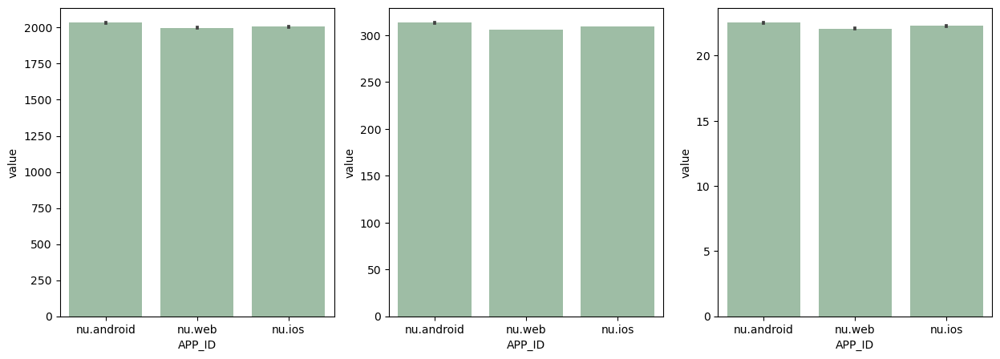

In [16]:
# generate a boxplot to see the data distribution by treatments. Using boxplot, we can 
# easily detect the differences between different treatments
fig, axes= plt.subplots(1, 3, figsize=(15, 5))
with_outliers = True
ax0 = sns.barplot(x='APP_ID', y='value', data=df_melt.loc[df_melt["variable"] == "num_chars"], color='#99c2a2', ax=axes[0])
ax1 = sns.barplot(x='APP_ID', y='value', data=df_melt.loc[df_melt["variable"] == "num_words"], color='#99c2a2', ax=axes[1])
ax2 = sns.barplot(x='APP_ID', y='value', data=df_melt.loc[df_melt["variable"] == "num_sentences"], color='#99c2a2', ax=axes[2])
# for ax in [ax0,ax1,ax2]:
#     ax.set_xlim()

plt.show()



# Correlation device and time of day
A graph has been created showing at what time of day interactions took place per device type. The samples taken from each category are equal, since in the dataset nu.web occurs more frequently than nu.ios and nu.android.

In [17]:
# TODO: Remove
ddf3 = ddf_views[[ "APP_ID", "dt_hour"]].compute()
ddf3.head()

,APP_ID,dt_hour
article_id,,
1005304,nu.web,10
1015214,nu.web,21
101809,nu.web,22
102273,nu.android,17
1028382,nu.web,17


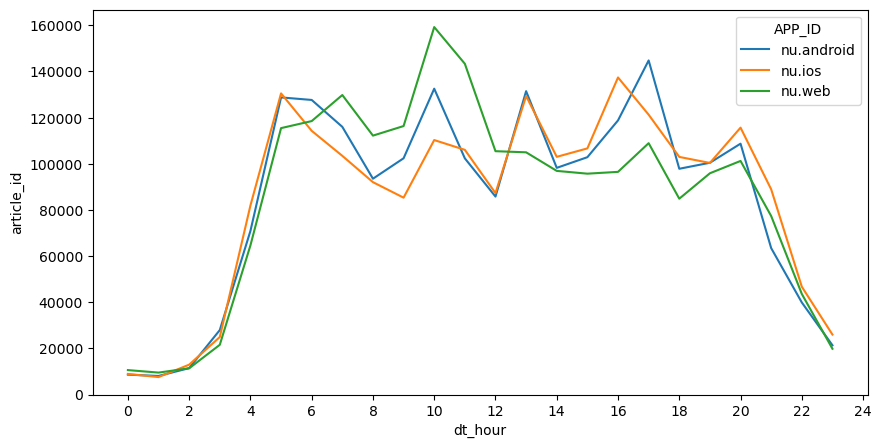

In [18]:
# TODO: Add a normalized graph
stepsize = 2
fig = plt.figure(figsize=(10, 5))
ax = sns.lineplot(x="dt_hour", y="article_id", hue="APP_ID" ,data=ddf3.reset_index().groupby(["APP_ID", "dt_hour"]).agg("count"))
ax.xaxis.set_ticks(np.arange(0, 26, stepsize))
plt.show()

# Correlation device and topic
For a correlation between device type and topic, only the most prominent topic from the articles has been considered. Kruskal Wallis H reveals a signficant relation between the topics and device type.

In [19]:
ddf_topics_merged = ddf_topics.merge(ddf_views[["APP_ID"]], how='inner')#.persist()
ddf_topics_merged


,topic_voetbal,topic_optredens_en_voorstellingen,topic_politiek,topic_technologie_en_handel,topic_relatie_en_opvoeden,topic_bestuur_en_organisatie,topic_human_interest,topic_verkeersongevallen,topic_nominatie_en_prijzen,topic_veiligheid,topic_onderwijs,topic_maatschappelijke_instellingen,topic_economie,topic_lokale_evenementen,topic_het_weer,topic_brand,topic_verkeer,topic_gezondheid_en_zorg,topic_gemeentepolitiek,topic_sport,topic_kunst_en_cultuur,topic_eten_en_drinken,topic_natuur,topic_duurzaamheid,topic_misdaad,topic_wielrennen,topic_zingeving_en_verhalen,topic_afval_en_milieuproblematiek,topic_consumeren_en_vrije_tijd,topic_overheidsbeleid,topic_vakbond_club_en_vereniging,topic_religie,topic_bouwen_en_wonen,topic_recht_en_justitie,topic_samenleving,topic_woon_en_leefomgeving,file_name,article_topic_entropy,argmax_topic,APP_ID
npartitions=14,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1005304,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,object,object
1013291,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
962788,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TNwse80V,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


3it [00:14,  4.96s/it]


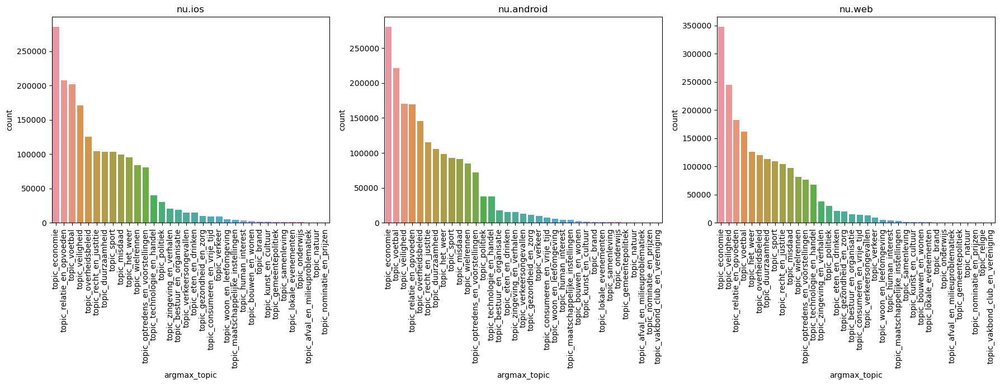

In [20]:
fig, axes = plt.subplots(1,3, figsize=(18, 7))
faxes = axes.flatten()
tmp = ddf_topics_merged[["argmax_topic", "APP_ID"]].compute()
for device, ax in tqdm.tqdm(zip(unique_devices, faxes)):
    order = tmp.loc[tmp["APP_ID"]==device]["argmax_topic"].value_counts().index
    ax = sns.countplot(data=tmp.loc[tmp["APP_ID"]==device], x="argmax_topic", ax=ax, order=order)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="center")
    ax.set_title(device)
fig.tight_layout()
plt.show()

In [21]:
l_test_results = list()
tmp = ddf_topics_merged.sample(frac=1).compute()
for topic in tqdm.tqdm(topic_columns):
    res = {"topic": topic, **pg.kruskal(data=tmp, dv=topic, between="APP_ID").iloc[0].to_dict()}
    l_test_results.append(res)
df_test_results = pd.DataFrame(l_test_results).sort_values("p-unc")
df_test_results

100%|██████████| 36/36 [03:59<00:00,  6.64s/it]


,topic,Source,ddof1,H,p-unc
0,topic_voetbal,APP_ID,2,5412.311449,0.000000e+00
22,topic_natuur,APP_ID,2,11876.116820,0.000000e+00
21,topic_eten_en_drinken,APP_ID,2,8884.612448,0.000000e+00
20,topic_kunst_en_cultuur,APP_ID,2,1651.714731,0.000000e+00
18,topic_gemeentepolitiek,APP_ID,2,2446.857920,0.000000e+00
34,topic_samenleving,APP_ID,2,6501.022392,0.000000e+00
16,topic_verkeer,APP_ID,2,3193.172995,0.000000e+00
15,topic_brand,APP_ID,2,2769.121070,0.000000e+00
26,topic_zingeving_en_verhalen,APP_ID,2,6583.763315,0.000000e+00
23,topic_duurzaamheid,APP_ID,2,6480.807534,0.000000e+00


100%|██████████| 36/36 [00:05<00:00,  7.12it/s]


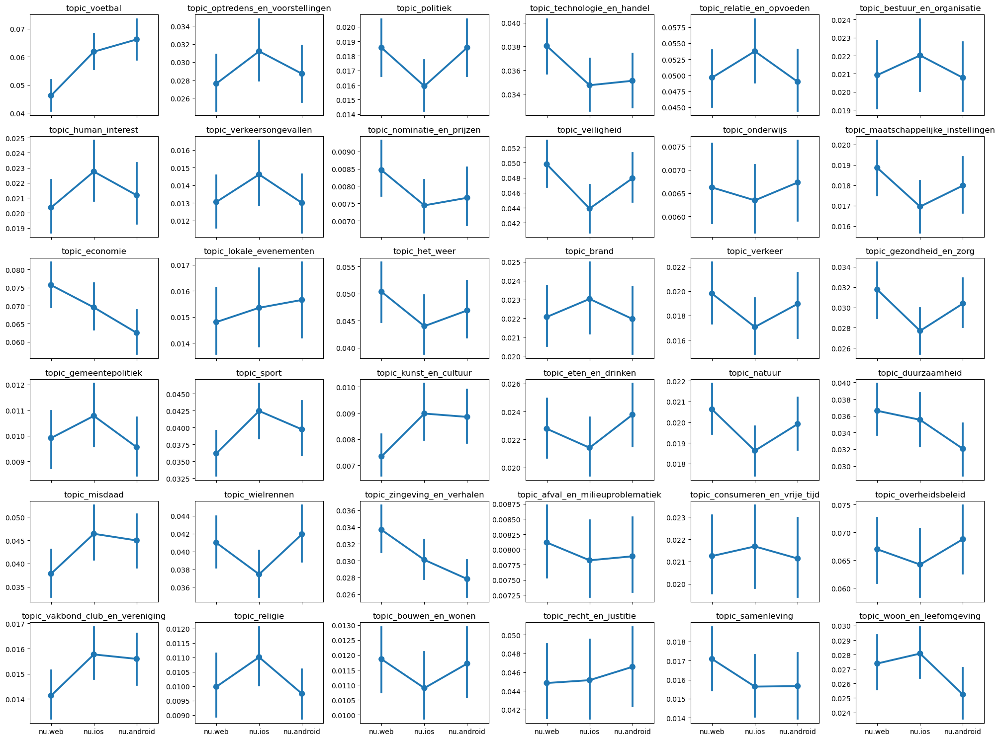

In [22]:
# TODO: Correct the yscales
fig, axes = plt.subplots(6,6,figsize=(20, 15), sharey=False, sharex=True)
faxes = axes.flatten()
tmp = ddf_topics_merged.sample(frac=0.001).compute()
for topic, ax in tqdm.tqdm(zip(topic_columns, faxes), total=len(topic_columns)):
    ax = sns.pointplot(data=tmp, x="APP_ID", y=topic, ax=ax)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_title(topic)
fig.tight_layout()  
plt.show()

# Correlation device and topic diversity
Topic diversity has been measured in terms of article entropy. The means of the entropies of articles across device types has been compared. Since it looks like a normal distribution, ANOVA has been applied. It results in a signficant p-value, but a low np2 means a small effect size.
There are no discernible clusters in a 2-dimensional space.


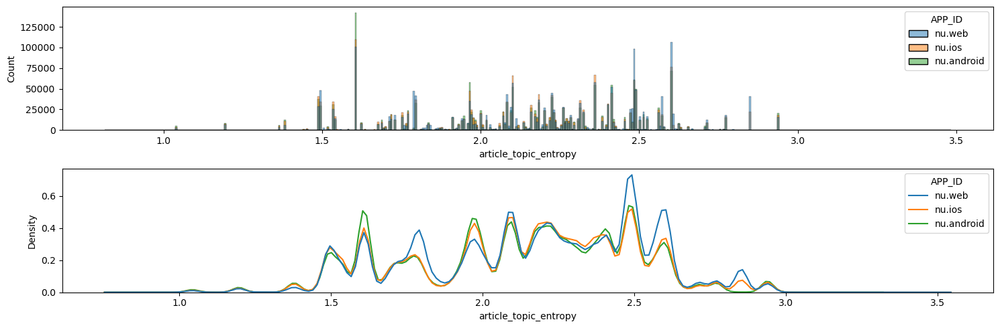

In [23]:
fig, axes = plt.subplots(2,1,figsize=(15, 5))
tmp = ddf_topics_merged.sample(frac=1).compute().reset_index()
sns.histplot(data=tmp, x="article_topic_entropy", hue="APP_ID", ax=axes[0])
sns.kdeplot(data=tmp, x="article_topic_entropy", hue="APP_ID", ax=axes[1])
fig.tight_layout()
plt.show()

In [24]:
# median_fun = pd.Aggregation(
#     name="median",
#     # this computes the median on each partition
#     chunk=lambda s: s.median(),
#     # this combines results across partitions; the input should just be a list of length 1
#     agg=lambda s0: s0.sum(),
# )
ddf_topics_merged[["APP_ID", "article_topic_entropy"]].groupby("APP_ID").agg(["mean", "std", "min", "max"]).compute()

article_topic_entropy                             
                            mean       std      min       max
APP_ID                                                       
nu.ios                  2.133004  0.363434  0.81376  3.482929
nu.android              2.117137  0.362407  0.81376  3.259468
nu.web                  2.169295  0.368163  0.81376  3.482929

In [25]:
tmp = ddf_topics_merged.compute()
pg.anova(data=tmp, dv='article_topic_entropy', between='APP_ID')

/home/bestname/anaconda3/envs/dpg/lib/python3.10/site-packages/pingouin/parametric.py:992: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  sserror = grp.apply(lambda x: (x - x.mean()) ** 2).sum()


,Source,ddof1,ddof2,F,p-unc,np2
0,APP_ID,2,5712985,10372.494356,0.0,0.003618


<AxesSubplot: xlabel='APP_ID', ylabel='article_topic_entropy'>

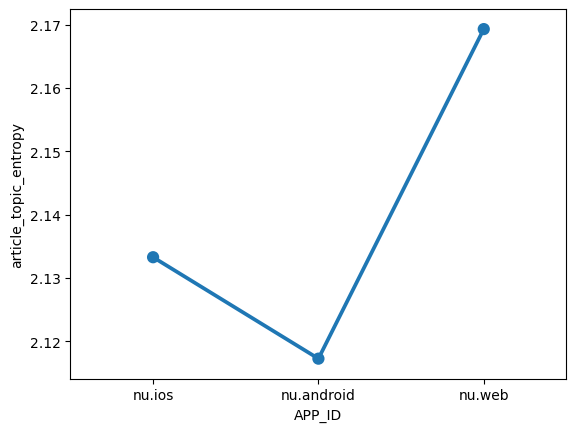

In [26]:
fig, ax = plt.subplots(1,1)
sns.pointplot(data=tmp, x="APP_ID", y='article_topic_entropy', ax=ax)

In [27]:
centroids = ddf_topics_merged[["APP_ID"]+list(topic_columns)].groupby("APP_ID").agg(np.mean).compute()
centroids

,topic_voetbal,topic_optredens_en_voorstellingen,topic_politiek,topic_technologie_en_handel,topic_relatie_en_opvoeden,topic_bestuur_en_organisatie,topic_human_interest,topic_verkeersongevallen,topic_nominatie_en_prijzen,topic_veiligheid,...,topic_zingeving_en_verhalen,topic_afval_en_milieuproblematiek,topic_consumeren_en_vrije_tijd,topic_overheidsbeleid,topic_vakbond_club_en_vereniging,topic_religie,topic_bouwen_en_wonen,topic_recht_en_justitie,topic_samenleving,topic_woon_en_leefomgeving
APP_ID,,,,,,,,,,,,,,,,,,,,,
nu.ios,0.064411,0.029395,0.016875,0.034440,0.054553,0.021697,0.022543,0.013409,0.007596,0.042566,...,0.029438,0.007595,0.021279,0.064493,0.015381,0.010472,0.010640,0.046135,0.016329,0.026235
nu.android,0.071502,0.026610,0.017782,0.035316,0.047380,0.021684,0.021489,0.012780,0.007368,0.043850,...,0.026974,0.007237,0.020989,0.071017,0.016086,0.009301,0.010511,0.047409,0.014944,0.026153
nu.web,0.048184,0.026296,0.017516,0.037654,0.048807,0.020399,0.021409,0.012030,0.008162,0.051903,...,0.031518,0.008189,0.022350,0.062668,0.014032,0.010575,0.012530,0.045756,0.016949,0.026861


In [28]:
# https://github.com/silviatti/topic-model-diversity
X = centroids.values
pd.DataFrame(cdist(X,X, "euclidean"), index=centroids.index, columns=centroids.index)

APP_ID,nu.ios,nu.android,nu.web
APP_ID,,,
nu.ios,0.000000,0.013471,0.024576
nu.android,0.013471,0.000000,0.030309
nu.web,0.024576,0.030309,0.000000


In [29]:
# https://github.com/silviatti/topic-model-diversity
X = centroids.values
pd.DataFrame(cdist(X,X, "cosine"), index=centroids.index, columns=centroids.index)

APP_ID,nu.ios,nu.android,nu.web
APP_ID,,,
nu.ios,0.000000,0.002280,0.007935
nu.android,0.002280,0.000000,0.011836
nu.web,0.007935,0.011836,0.000000


<AxesSubplot: >

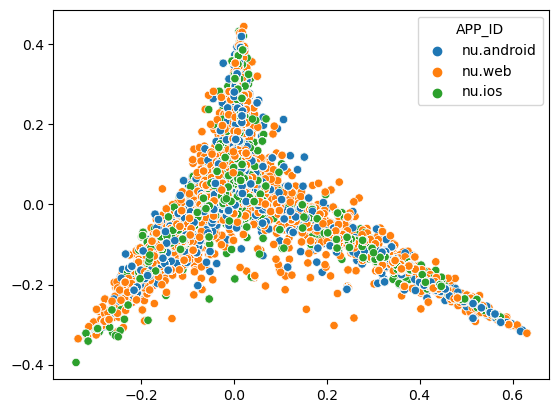

In [30]:
from sklearn.decomposition import PCA
reducer = PCA(2)
data = ddf_topics_merged.sample(frac=1).dropna().compute()
reduced_data = reducer.fit_transform(data[list(topic_columns)])
sns.scatterplot(x = reduced_data[:, 0], y = reduced_data[:, 1], hue=data["APP_ID"])

# Correlation device and USERNEEDS
Kruskal Wallis H reveals a signficant p-value for all the different userneeds across device types

In [31]:
ddf_userneeds_merged = ddf_userneeds.merge(ddf_views[["APP_ID"]])
ddf_userneeds_merged

,userneed_hou_me_op_de_hoogte,userneed_geef_me_context,userneed_vermaak_me,userneed_raak_me_verbind_me,userneed_help_me,file_name,argmax_userneeds,APP_ID
npartitions=14,,,,,,,,
1005304,float64,float64,float64,float64,float64,int64,object,object
1013291,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...
962788,...,...,...,...,...,...,...,...
TNwse80V,...,...,...,...,...,...,...,...


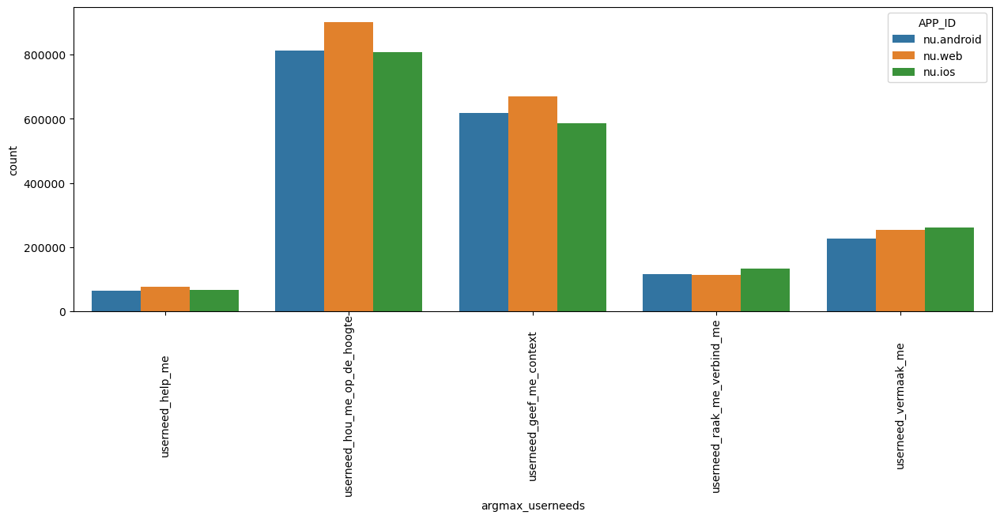

In [32]:
fig, axes = plt.subplots(1,1,figsize=(15, 5))
tmp = ddf_userneeds_merged[["argmax_userneeds", "APP_ID"]].compute()
ax = sns.countplot(data=tmp, x="argmax_userneeds", hue="APP_ID", ax=axes)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, va="center", position=(0,-0.28))
plt.show()

In [33]:
l_test_results = list()
tmp = ddf_userneeds_merged.sample(frac=0.1).compute()
for need in tqdm.tqdm(columns_userneeds):
    res = {"need": need, **pg.kruskal(data=tmp, dv=need, between="APP_ID").iloc[0].to_dict()}
    l_test_results.append(res)
df_test_results = pd.DataFrame(l_test_results).sort_values("p-unc")
df_test_results

100%|██████████| 5/5 [00:02<00:00,  1.85it/s]


,need,Source,ddof1,H,p-unc
3,userneed_raak_me_verbind_me,APP_ID,2,510.599155,1.332914e-111
2,userneed_vermaak_me,APP_ID,2,508.631108,3.565809e-111
1,userneed_geef_me_context,APP_ID,2,383.235878,6.044864e-84
4,userneed_help_me,APP_ID,2,139.568680,4.932263e-31
0,userneed_hou_me_op_de_hoogte,APP_ID,2,127.230508,2.356385e-28


100%|██████████| 5/5 [00:41<00:00,  8.30s/it]


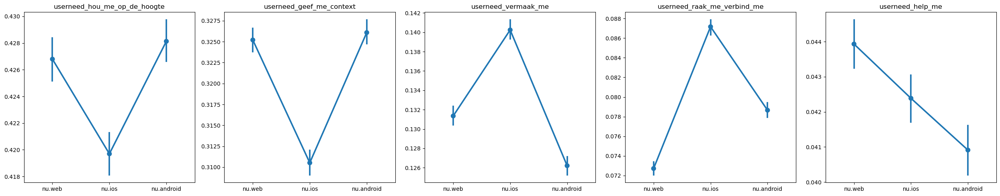

In [34]:
fig, axes = plt.subplots(1, len(columns_userneeds),figsize=(25, 5), sharey=False, sharex=True)
faxes = axes.flatten()
tmp = ddf_userneeds_merged.sample(frac=0.1).compute()
for need, ax in tqdm.tqdm(zip(columns_userneeds, faxes), total=len(columns_userneeds)):
    ax = sns.pointplot(data=tmp, x="APP_ID", y=need, ax=ax)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_title(need)
fig.tight_layout()  
plt.show()

# SENSITIVE ARTICLES

In [35]:
ddf_sensitivity_merged = ddf_sensitivity.merge(ddf_views[["APP_ID"]], how="inner")
ddf_sensitivity_merged

,sensitive_topic_adult,sensitive_topic_arms,sensitive_topic_crime,sensitive_topic_death,sensitive_topic_drugs,sensitive_topic_hate_speech,sensitive_topic_obscenity,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,file_name,argmax_sensitivity,is_sensitive,article_sensitivity_entropy,APP_ID
npartitions=14,,,,,,,,,,,,,,,,,,
1005304,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,object,float64,float64,object
1013291,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
962788,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TNwse80V,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


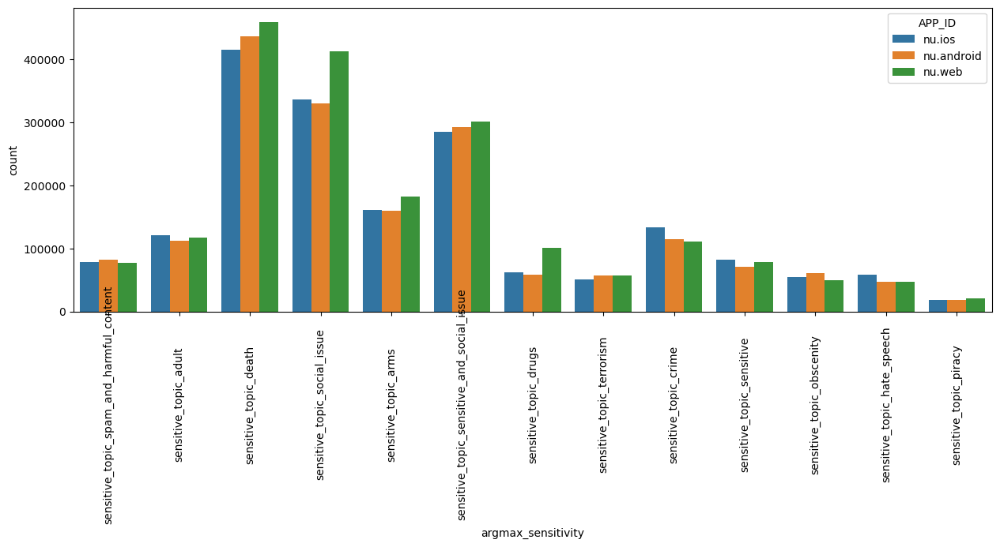

In [36]:
fig, axes = plt.subplots(1,1,figsize=(15, 5))
tmp = ddf_sensitivity_merged[["argmax_sensitivity", "APP_ID"]].compute()
ax = sns.countplot(data=tmp, x="argmax_sensitivity", hue="APP_ID", ax=axes)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, va="center", position=(0,-0.28))
plt.show()

In [37]:
l_test_results = list()
tmp = ddf_sensitivity_merged.sample(frac=0.1).compute()
for sensitivity in tqdm.tqdm(columns_sensitivity):
    res = {"need": need, **pg.kruskal(data=tmp, dv=sensitivity, between="APP_ID").iloc[0].to_dict()}
    l_test_results.append(res)
df_test_results = pd.DataFrame(l_test_results).sort_values("p-unc")
df_test_results

100%|██████████| 13/13 [00:09<00:00,  1.43it/s]


,need,Source,ddof1,H,p-unc
2,userneed_help_me,APP_ID,2,407.916746,2.642433e-89
0,userneed_help_me,APP_ID,2,339.034655,2.396404e-74
7,userneed_help_me,APP_ID,2,283.552160,2.675659e-62
12,userneed_help_me,APP_ID,2,211.372085,1.262219e-46
5,userneed_help_me,APP_ID,2,201.837398,1.484451e-44
3,userneed_help_me,APP_ID,2,124.218026,1.062670e-27
8,userneed_help_me,APP_ID,2,93.095172,6.090322e-21
10,userneed_help_me,APP_ID,2,87.153949,1.187847e-19
9,userneed_help_me,APP_ID,2,71.486779,2.998080e-16
6,userneed_help_me,APP_ID,2,67.280875,2.455521e-15


100%|██████████| 13/13 [01:46<00:00,  8.21s/it]


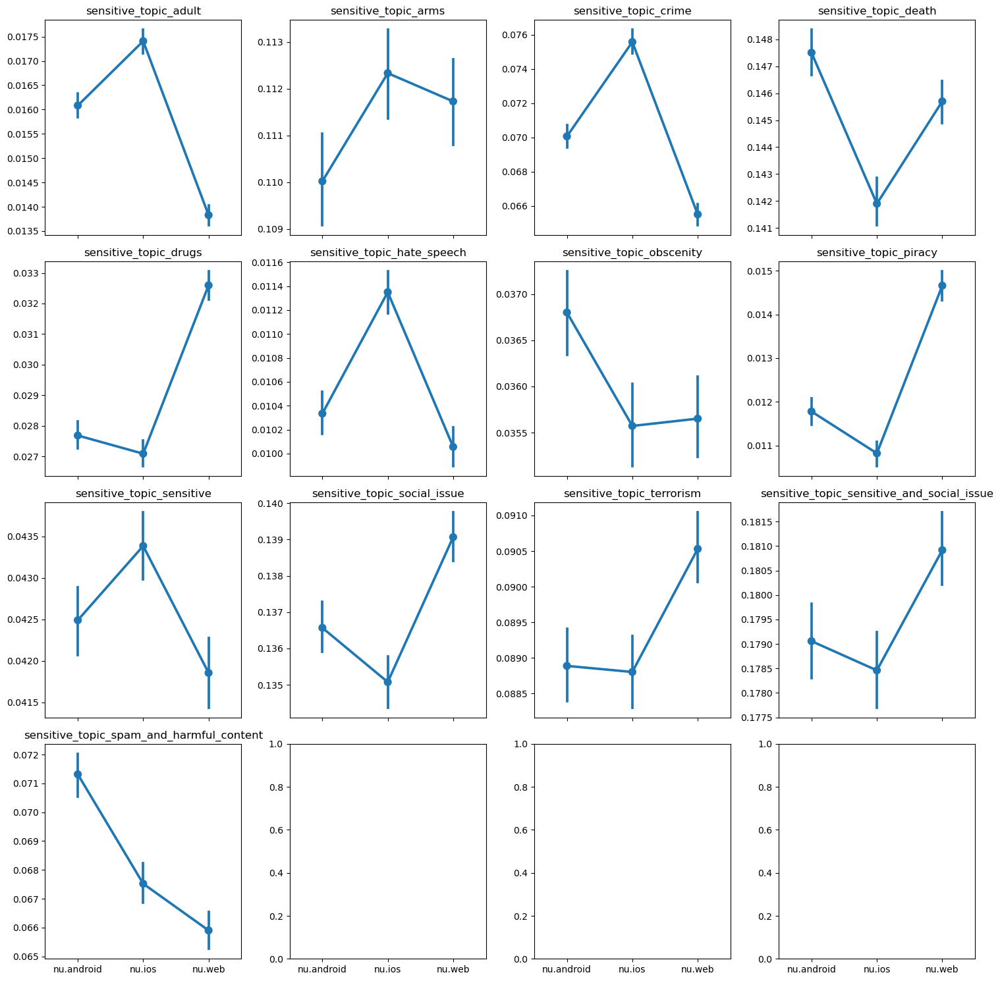

In [38]:
fig, axes = plt.subplots(4, 4,figsize=(15, 15), sharey=False, sharex=True)
faxes = axes.flatten()
tmp = ddf_sensitivity_merged.sample(frac=0.1).compute()
for sensitivity, ax in tqdm.tqdm(zip(columns_sensitivity, faxes), total=len(columns_sensitivity)):
    ax = sns.pointplot(data=tmp, x="APP_ID", y=sensitivity, ax=ax)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_title(sensitivity)
fig.tight_layout()  
plt.show()

In [39]:
tmp

,sensitive_topic_adult,sensitive_topic_arms,sensitive_topic_crime,sensitive_topic_death,sensitive_topic_drugs,sensitive_topic_hate_speech,sensitive_topic_obscenity,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,file_name,argmax_sensitivity,is_sensitive,article_sensitivity_entropy,APP_ID
article_id,,,,,,,,,,,,,,,,,,
6177871,0.000000,0.000000,0.000000,0.514735,0.0,0.000000,0.485265,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0,sensitive_topic_death,1.0,0.692713,nu.android
6191838,0.000000,0.320999,0.000000,0.000000,0.0,0.000000,0.679001,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,2,sensitive_topic_obscenity,1.0,0.627620,nu.ios
6127238,0.458647,0.000000,0.101339,0.000000,0.0,0.145174,0.000000,0.0,0.099245,0.000000,0.000000,0.099245,0.09635,3,sensitive_topic_adult,1.0,1.553639,nu.web
6177365,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,3,sensitive_topic_adult,0.0,0.000000,nu.web
6190810,0.000000,0.000000,0.000000,0.326959,0.0,0.000000,0.000000,0.0,0.157523,0.178997,0.000000,0.336521,0.00000,2,sensitive_topic_sensitive_and_social_issue,1.0,1.331093,nu.android
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6192843,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.500000,0.000000,0.500000,0.00000,3,sensitive_topic_social_issue,1.0,0.693147,nu.ios
6192845,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.500000,0.000000,0.500000,0.00000,3,sensitive_topic_social_issue,1.0,0.693147,nu.web
6192850,0.077032,0.000000,0.247473,0.077035,0.0,0.000000,0.000000,0.0,0.000000,0.257049,0.084362,0.257049,0.00000,3,sensitive_topic_social_issue,1.0,1.647530,nu.web


# LOCATION

In [40]:
# https://pypi.org/project/pgeocode/
# https://www.cbs.nl/en-gb/our-services/open-data/statline-as-open-data/cartography
ddf_location = ddf_views[["GEO_CITY","GEO_COUNTRY","GEO_REGION","GEO_ZIPCODE", "APP_ID", "ARTICLE_ID"]].dropna(subset="GEO_ZIPCODE")
ddf_location["article_id"] = ddf_location["ARTICLE_ID"]
ddf_location["postal_code"] = ddf_location["GEO_ZIPCODE"]
ddf_location = ddf_location.set_index("postal_code")
display(ddf_location.head())
display(ddf_location)

,GEO_CITY,GEO_COUNTRY,GEO_REGION,GEO_ZIPCODE,APP_ID,ARTICLE_ID,article_id
postal_code,,,,,,,
00-019,2478,PL,14,00-019,nu.android,6192673,6192673
00-019,2478,PL,14,00-019,nu.android,6192778,6192778
00-019,2478,PL,14,00-019,nu.android,6192812,6192812
00-019,2478,PL,14,00-019,nu.android,6192736,6192736
00-120,2478,PL,14,00-120,nu.web,6192535,6192535


,GEO_CITY,GEO_COUNTRY,GEO_REGION,GEO_ZIPCODE,APP_ID,ARTICLE_ID,article_id
npartitions=12,,,,,,,
00-019,int64,object,object,object,object,object,object
1055,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...
8265,...,...,...,...,...,...,...
xbx,...,...,...,...,...,...,...


In [41]:
# ddf_location.groupby("APP_ID").agg(lambda df: df["GEO_REGION"].value_counts()).compute()

In [42]:
unique_postal_codes = ddf_location["GEO_ZIPCODE"].unique().compute()
unique_postal_codes.values

array(['00-019', '00-120', '00-158', ..., 'vct', 'vlt', 'xbx'],
      dtype=object)

In [43]:
nomi = geo.Nominatim('nl')
all_location_data = nomi.query_postal_code(unique_postal_codes.values).set_index('postal_code').dropna(how="all")
all_location_data.index = all_location_data.index.astype("str")
all_location_data["county_code"] = all_location_data["county_code"].astype("object")
all_location_data

,country_code,place_name,state_name,state_code,county_name,county_code,community_name,community_code,latitude,longitude,accuracy
postal_code,,,,,,,,,,,
1011,NL,Amsterdam,Noord-Holland,7.0,Amsterdam,363.0,NaN,NaN,52.3710,4.9041,6.0
1012,NL,Amsterdam,Noord-Holland,7.0,Amsterdam,363.0,NaN,NaN,52.3735,4.8951,6.0
1013,NL,Amsterdam,Noord-Holland,7.0,Amsterdam,363.0,NaN,NaN,52.3877,4.8839,6.0
1014,NL,Amsterdam,Noord-Holland,7.0,Amsterdam,363.0,NaN,NaN,52.3908,4.8668,6.0
1015,NL,Amsterdam,Noord-Holland,7.0,Amsterdam,363.0,NaN,NaN,52.3784,4.8836,6.0
...,...,...,...,...,...,...,...,...,...,...,...
9991,NL,Middelstum,Groningen,4.0,Eemsdelta,1979.0,NaN,NaN,53.3457,6.6422,6.0
9992,NL,Huizinge,Groningen,4.0,Eemsdelta,1979.0,NaN,NaN,53.3466,6.6747,6.0
9994,NL,Toornwerd,Groningen,4.0,Eemsdelta,1979.0,NaN,NaN,53.3540,6.6381,6.0


In [44]:
# Got data from here! https://www.webuildinternet.com/2015/07/09/geojson-data-of-the-netherlands/
gdf = gpd.read_file('townships.geojson')
gdf["county_code"] = None
gdf["county_code"] = gdf["code"].astype(int)
gdf

,code,name,regioFacet,level,url,geometry,county_code
0,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680
1,0106,Assen,tcm:106-353399-1024,4,/regioinformatie/gemeente/assen/,"MULTIPOLYGON (((6.51304 53.01056, 6.50998 53.0...",106
2,1681,Borger-Odoorn,tcm:106-353400-1024,4,/regioinformatie/gemeente/borger-odoorn/,"MULTIPOLYGON (((6.75179 52.86402, 6.74729 52.8...",1681
3,0109,Coevorden,tcm:106-353401-1024,4,/regioinformatie/gemeente/coevorden/,"MULTIPOLYGON (((6.61615 52.76292, 6.66088 52.8...",109
4,1690,De Wolden,tcm:106-353402-1024,4,/regioinformatie/gemeente/de-wolden/,"MULTIPOLYGON (((6.27430 52.70619, 6.25312 52.7...",1690
...,...,...,...,...,...,...,...
389,0707,Zederik,tcm:106-353812-1024,4,/regioinformatie/gemeente/zederik/,"MULTIPOLYGON (((4.99497 51.90229, 4.97341 51.8...",707
390,0637,Zoetermeer,tcm:106-353813-1024,4,/regioinformatie/gemeente/zoetermeer/,"MULTIPOLYGON (((4.47237 52.03828, 4.47074 52.0...",637
391,0638,Zoeterwoude,tcm:106-353814-1024,4,/regioinformatie/gemeente/zoeterwoude/,"MULTIPOLYGON (((4.49372 52.12999, 4.51321 52.1...",638
392,1892,Zuidplas,tcm:106-353815-1024,4,/regioinformatie/gemeente/zuidplas/,"MULTIPOLYGON (((4.59877 51.98797, 4.59437 51.9...",1892


In [45]:
ddf_location_full = ddf_location.merge(all_location_data[["county_code","county_name"]]).reset_index().set_index('article_id')
ddf_location_full = ddf_location_full.merge(ddf_topics[["argmax_topic", "article_topic_entropy"]])
ddf_location_full = ddf_location_full.merge(ddf_article[["num_words", "num_sentences"]])
ddf_location_full = ddf_location_full.merge(ddf_userneeds[columns_userneeds])
ddf_location_full = ddf_location_full.merge(ddf_sensitivity[list(columns_sensitivity)+["article_sensitivity_entropy", "argmax_sensitivity"]])
ddf_location_full = ddf_location_full.persist()
ddf_location_full

,postal_code,GEO_CITY,GEO_COUNTRY,GEO_REGION,GEO_ZIPCODE,APP_ID,ARTICLE_ID,county_code,county_name,argmax_topic,article_topic_entropy,num_words,num_sentences,userneed_hou_me_op_de_hoogte,userneed_geef_me_context,userneed_vermaak_me,userneed_raak_me_verbind_me,userneed_help_me,sensitive_topic_adult,sensitive_topic_arms,sensitive_topic_crime,sensitive_topic_death,sensitive_topic_drugs,sensitive_topic_hate_speech,sensitive_topic_obscenity,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,article_sensitivity_entropy,argmax_sensitivity
npartitions=18,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1005304,object,int64,object,object,object,object,object,object,object,object,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object
1013291,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
962788,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TNwse80V,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [46]:
ddf_location_agg_count = ddf_location_full[["APP_ID", "ARTICLE_ID", "county_code"]].groupby(["county_code", "APP_ID"]).count().compute().reset_index()
ddf_location_agg_count

,county_code,APP_ID,ARTICLE_ID
0,14.0,nu.android,22248
1,14.0,nu.ios,21230
2,14.0,nu.web,24661
3,34.0,nu.android,21000
4,34.0,nu.ios,19307
...,...,...,...
1054,1978.0,nu.web,2413
1055,1979.0,nu.android,2970
1056,1979.0,nu.ios,1877
1057,1979.0,nu.web,2672


In [47]:
gdf_device_counts = gdf.merge(ddf_location_agg_count, left_on="county_code", right_on="county_code", how="left")
gdf_device_counts["counts_scaled"] = (gdf_device_counts["ARTICLE_ID"] - gdf_device_counts["ARTICLE_ID"].mean()) / gdf_device_counts["ARTICLE_ID"].std()
gdf_device_counts["counts_logged"] = np.log(gdf_device_counts["ARTICLE_ID"]) 
gdf_device_counts["counts_normed"] = gdf_device_counts[["APP_ID", "counts_logged"]].groupby("APP_ID").transform(lambda df: (df - df.min())/(df.max()-df.min()))
gdf_device_counts.head(10)

,code,name,regioFacet,level,url,geometry,county_code,APP_ID,ARTICLE_ID,counts_scaled,counts_logged,counts_normed
0,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680,nu.android,1831.0,-0.226337,7.512618,0.413684
1,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680,nu.ios,1451.0,-0.252231,7.280008,0.374832
2,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680,nu.web,1518.0,-0.247665,7.325149,0.408009
3,0106,Assen,tcm:106-353399-1024,4,/regioinformatie/gemeente/assen/,"MULTIPOLYGON (((6.51304 53.01056, 6.50998 53.0...",106,nu.android,9099.0,0.268914,9.115920,0.617769
4,0106,Assen,tcm:106-353399-1024,4,/regioinformatie/gemeente/assen/,"MULTIPOLYGON (((6.51304 53.01056, 6.50998 53.0...",106,nu.ios,7227.0,0.141354,8.885579,0.574286
5,0106,Assen,tcm:106-353399-1024,4,/regioinformatie/gemeente/assen/,"MULTIPOLYGON (((6.51304 53.01056, 6.50998 53.0...",106,nu.web,8177.0,0.206088,9.009081,0.604508
6,1681,Borger-Odoorn,tcm:106-353400-1024,4,/regioinformatie/gemeente/borger-odoorn/,"MULTIPOLYGON (((6.75179 52.86402, 6.74729 52.8...",1681,nu.android,1401.0,-0.255638,7.244942,0.379612
7,1681,Borger-Odoorn,tcm:106-353400-1024,4,/regioinformatie/gemeente/borger-odoorn/,"MULTIPOLYGON (((6.75179 52.86402, 6.74729 52.8...",1681,nu.ios,905.0,-0.289436,6.807935,0.316188
8,1681,Borger-Odoorn,tcm:106-353400-1024,4,/regioinformatie/gemeente/borger-odoorn/,"MULTIPOLYGON (((6.75179 52.86402, 6.74729 52.8...",1681,nu.web,1202.0,-0.269198,7.091742,0.380773
9,0109,Coevorden,tcm:106-353401-1024,4,/regioinformatie/gemeente/coevorden/,"MULTIPOLYGON (((6.61615 52.76292, 6.66088 52.8...",109,nu.android,2472.0,-0.182658,7.812783,0.451892


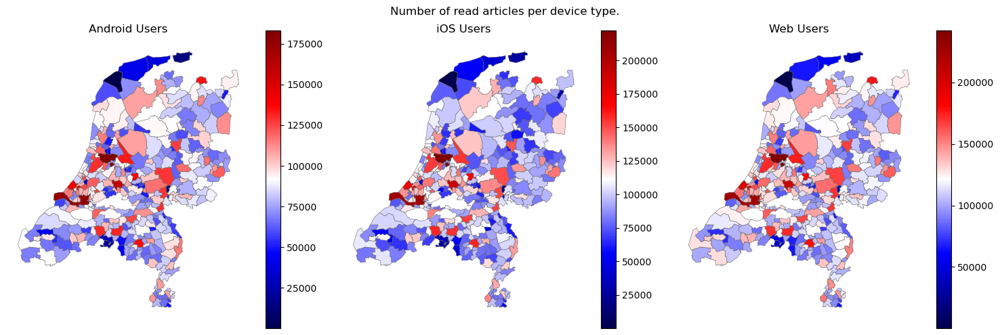

In [48]:
fig, axes = plt.subplots(1,3, figsize=(15,5))

bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.android"]["ARTICLE_ID"].min(), vmax=gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.android"]["ARTICLE_ID"].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info, ax=axes[0])
gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.android"].plot(column="counts_logged", cmap="seismic", linewidth=0.4, ax=axes[0], edgecolor=".4")

bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.ios"]["ARTICLE_ID"].min(), vmax=gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.ios"]["ARTICLE_ID"].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info, ax=axes[1])
gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.ios"].plot(column="counts_logged", cmap="seismic", linewidth=0.4, ax=axes[1], edgecolor=".4")

bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.web"]["ARTICLE_ID"].min(), vmax=gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.web"]["ARTICLE_ID"].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info, ax=axes[2])
gdf_device_counts[gdf_device_counts["APP_ID"] == "nu.web"].plot(column="counts_logged", cmap="seismic", linewidth=0.4, ax=axes[2], edgecolor=".4")

for ax in axes:
    ax.set_axis_off()
axes[0].set_title("Android Users")    
axes[1].set_title("iOS Users")    
axes[2].set_title("Web Users")    
fig.suptitle("Number of read articles per device type.")    
fig.tight_layout()

In [49]:
ddf_location_reduced = ddf_location_full.groupby(['county_code', 'APP_ID']).mean().compute()
ddf_location_reduced

GEO_CITY  article_topic_entropy   num_words  \
county_code APP_ID                                                       
14.0        nu.android   149.990876               2.123214  307.593851   
            nu.ios       141.933396               2.133325  299.329675   
            nu.web       148.044848               2.172007  294.457402   
34.0        nu.android   151.298667               2.103757  306.571524   
            nu.ios       148.624748               2.125808  304.301341   
...                             ...                    ...         ...   
1978.0      nu.web      1388.492333               2.179683  294.619561   
1979.0      nu.android   728.288215               2.147744  322.990236   
            nu.ios       810.711241               2.146572  314.157166   
            nu.web       926.018338               2.171219  299.236527   
96.0        nu.ios       723.000000               2.121999  318.380282   

                        num_sentences  userneed_hou_me_op_de_hoogte  \
county_code APP_ID                                                    
14.0        nu.android      22.105133                      0.416520   
            nu.ios          21.529157                      0.404578   
            nu.web          21.210332                      0.408251   
34.0        nu.android      22.079190                      0.428113   
            nu.ios          21.935516                      0.414784   
...                               ...                           ...   
1978.0      nu.web          21.238293                      0.429584   
1979.0      nu.android      23.087542                      0.410756   
            nu.ios          22.679275                      0.395964   
            nu.web          21.593189                      0.403312   
96.0        nu.ios          23.183099                      0.367929   

                        userneed_geef_me_context  userneed_vermaak_me  \
county_code APP_ID                                                      
14.0        nu.android                  0.330212             0.130206   
            nu.ios                      0.315767             0.146321   
            nu.web                      0.328284             0.141932   
34.0        nu.android                  0.323963             0.126802   
            nu.ios                      0.313888             0.139654   
...                                          ...                  ...   
1978.0      nu.web                      0.329696             0.128857   
1979.0      nu.android                  0.341434             0.119943   
            nu.ios                      0.342205             0.134717   
            nu.web                      0.349860             0.124602   
96.0        nu.ios                      0.364614             0.145545   

                        userneed_raak_me_verbind_me  userneed_help_me  \
county_code APP_ID                                                      
14.0        nu.android                     0.084599          0.038463   
            nu.ios                         0.093426          0.039907   
            nu.web                         0.079555          0.041979   
34.0        nu.android                     0.078365          0.042759   
            nu.ios                         0.087759          0.043915   
...                                             ...               ...   
1978.0      nu.web                         0.070239          0.041624   
1979.0      nu.android                     0.082182          0.045685   
            nu.ios                         0.080087          0.047027   
            nu.web                         0.075631          0.046595   
96.0        nu.ios                         0.079241          0.042671   

                        sensitive_topic_adult  ...  sensitive_topic_drugs  \
county_code APP_ID                             ...                          
14.0        nu.android               0.015732  ...               0.027325   
         

In [50]:
gdf_location = gdf.merge(ddf_location_reduced.reset_index(), left_on="county_code", right_on="county_code", how="left")
gdf_location

,code,name,regioFacet,level,url,geometry,county_code,APP_ID,GEO_CITY,article_topic_entropy,...,sensitive_topic_drugs,sensitive_topic_hate_speech,sensitive_topic_obscenity,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,article_sensitivity_entropy
0,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680,nu.android,1872.196614,2.116227,...,0.028940,0.010909,0.036750,0.010797,0.045767,0.150984,0.080725,0.196751,0.069047,1.202575
1,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680,nu.ios,1799.095796,2.130138,...,0.030624,0.012020,0.040392,0.013674,0.047553,0.135574,0.084567,0.183127,0.063706,1.201984
2,1680,Aa en Hunze,tcm:106-353398-1024,4,/regioinformatie/gemeente/aa-en-hunze/,"MULTIPOLYGON (((6.64859 53.02633, 6.64466 53.0...",1680,nu.web,1826.689065,2.185074,...,0.029705,0.011470,0.033883,0.017965,0.043743,0.135857,0.092399,0.179600,0.072475,1.248114
3,0106,Assen,tcm:106-353399-1024,4,/regioinformatie/gemeente/assen/,"MULTIPOLYGON (((6.51304 53.01056, 6.50998 53.0...",106,nu.android,17.116496,2.114648,...,0.027296,0.011174,0.036926,0.011935,0.044035,0.132610,0.090960,0.176646,0.070564,1.219562
4,0106,Assen,tcm:106-353399-1024,4,/regioinformatie/gemeente/assen/,"MULTIPOLYGON (((6.51304 53.01056, 6.50998 53.0...",106,nu.ios,57.776256,2.131140,...,0.027201,0.011453,0.034697,0.010856,0.045020,0.135988,0.088971,0.181008,0.067034,1.207481
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061,1892,Zuidplas,tcm:106-353815-1024,4,/regioinformatie/gemeente/zuidplas/,"MULTIPOLYGON (((4.59877 51.98797, 4.59437 51.9...",1892,nu.ios,240.619307,2.132154,...,0.028678,0.011181,0.035647,0.008082,0.043865,0.132084,0.089666,0.175950,0.069745,1.193119
1062,1892,Zuidplas,tcm:106-353815-1024,4,/regioinformatie/gemeente/zuidplas/,"MULTIPOLYGON (((4.59877 51.98797, 4.59437 51.9...",1892,nu.web,265.081340,2.177149,...,0.034218,0.009220,0.036528,0.015570,0.041942,0.142576,0.087736,0.184519,0.067851,1.200609
1063,0642,Zwijndrecht,tcm:106-353816-1024,4,/regioinformatie/gemeente/zwijndrecht/,"MULTIPOLYGON (((4.56674 51.81283, 4.56118 51.8...",642,nu.android,662.956522,2.132067,...,0.028291,0.009808,0.039375,0.013633,0.047445,0.134065,0.089955,0.181510,0.066120,1.215775
1064,0642,Zwijndrecht,tcm:106-353816-1024,4,/regioinformatie/gemeente/zwijndrecht/,"MULTIPOLYGON (((4.56674 51.81283, 4.56118 51.8...",642,nu.ios,654.328612,2.134521,...,0.026940,0.010715,0.034815,0.011499,0.044738,0.128881,0.091591,0.173619,0.073636,1.209193


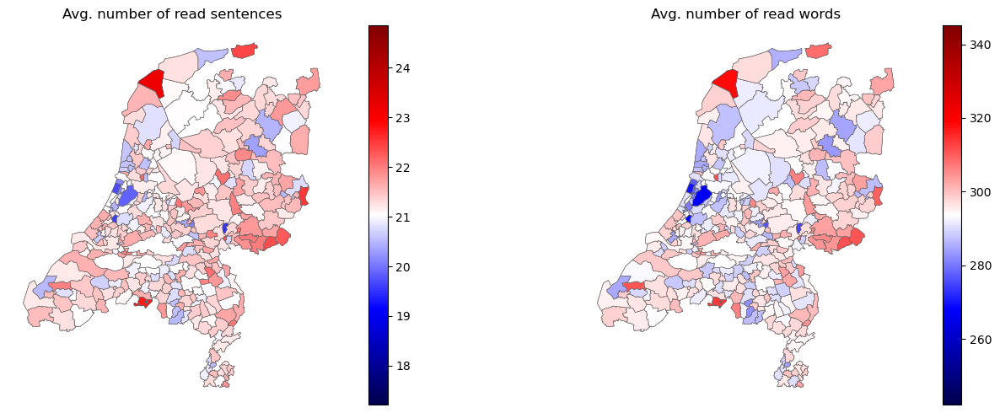

In [51]:
fig, axes = plt.subplots(1,2, figsize=(15,5))

column="num_sentences"
bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[column].min(), vmax=gdf_location[column].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info, ax=axes[0])
gdf_location.plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[0], edgecolor=".4")

column="num_words"
bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[column].min(), vmax=gdf_location[column].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info, ax=axes[1])
gdf_location.plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[1], edgecolor=".4")

for ax in axes:
    ax.set_axis_off()
axes[0].set_title("Avg. number of read sentences")    
axes[1].set_title("Avg. number of read words")  

fig.tight_layout()
plt.show()

/tmp/ipykernel_5584/3077191496.py:5: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = fig.colorbar(bar_info)


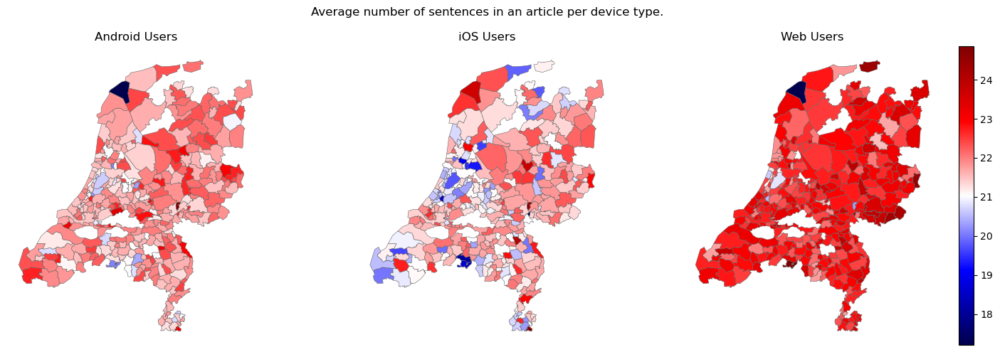

In [52]:
column="num_sentences"
fig, axes = plt.subplots(1,3, figsize=(15,5))
bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[column].min(), vmax=gdf_location[column].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info)
gdf_location[gdf_location["APP_ID"] == "nu.android"].plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[0], edgecolor=".4")
gdf_location[gdf_location["APP_ID"] == "nu.ios"].plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[1], edgecolor=".4")
gdf_location[gdf_location["APP_ID"] == "nu.web"].plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[2], edgecolor=".4")
for ax in axes:
    ax.set_axis_off()
axes[0].set_title("Android Users")    
axes[1].set_title("iOS Users")    
axes[2].set_title("Web Users")    
fig.suptitle("Average number of sentences in an article per device type.")    
fig.tight_layout()

/tmp/ipykernel_5584/2764776757.py:5: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = fig.colorbar(bar_info)


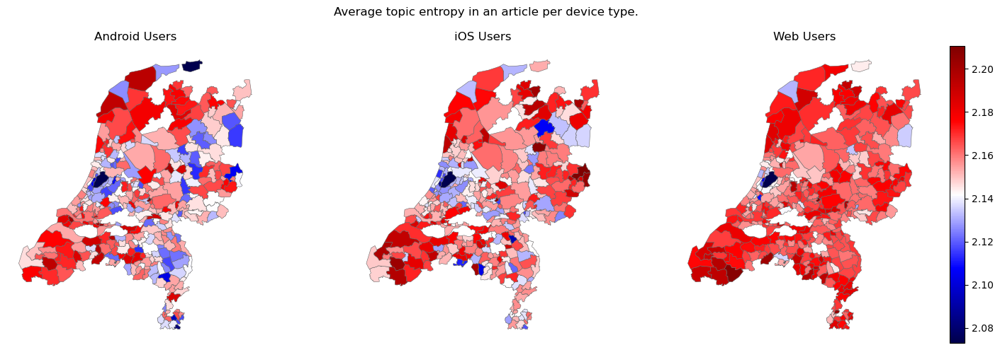

In [53]:
column="article_topic_entropy"
fig, axes = plt.subplots(1,3, figsize=(15,5))
bar_info = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[column].min(), vmax=gdf_location[column].max()))
bar_info._A = []
cbar = fig.colorbar(bar_info)
gdf_location[gdf_location["APP_ID"] == "nu.android"].plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[0], edgecolor=".4")
gdf_location[gdf_location["APP_ID"] == "nu.ios"].plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[1], edgecolor=".4")
gdf_location[gdf_location["APP_ID"] == "nu.web"].plot(column=column, cmap="seismic", linewidth=0.4, ax=axes[2], edgecolor=".4")
for ax in axes:
    ax.set_axis_off()
axes[0].set_title("Android Users")    
axes[1].set_title("iOS Users")    
axes[2].set_title("Web Users")    
fig.suptitle("Average topic entropy in an article per device type.")    
fig.tight_layout()

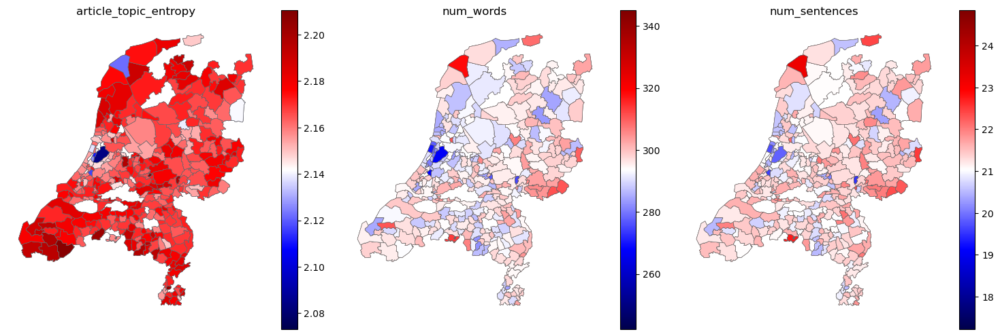

In [54]:
column1="article_topic_entropy"
column2="num_words"
column3="num_sentences"
fig, axes = plt.subplots(1,3, figsize=(15,5))
tmp_cols = [column1,column2,column3]
faxes = axes
for col, ax in zip(tmp_cols, faxes):
    bar_info1 = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[col].min(), vmax=gdf_location[col].max()))
    bar_info1._A = []
    cbar1 = fig.colorbar(bar_info1, ax=ax)
    gdf_location.plot(column=col, cmap="seismic", linewidth=0.4, ax=ax, edgecolor=".4")
    # ax.set_xlim(0,1)
    ax.set_axis_off()
    ax.set_title(f"{col}")
faxes[-1].set_axis_off()        
fig.tight_layout()
plt.show()

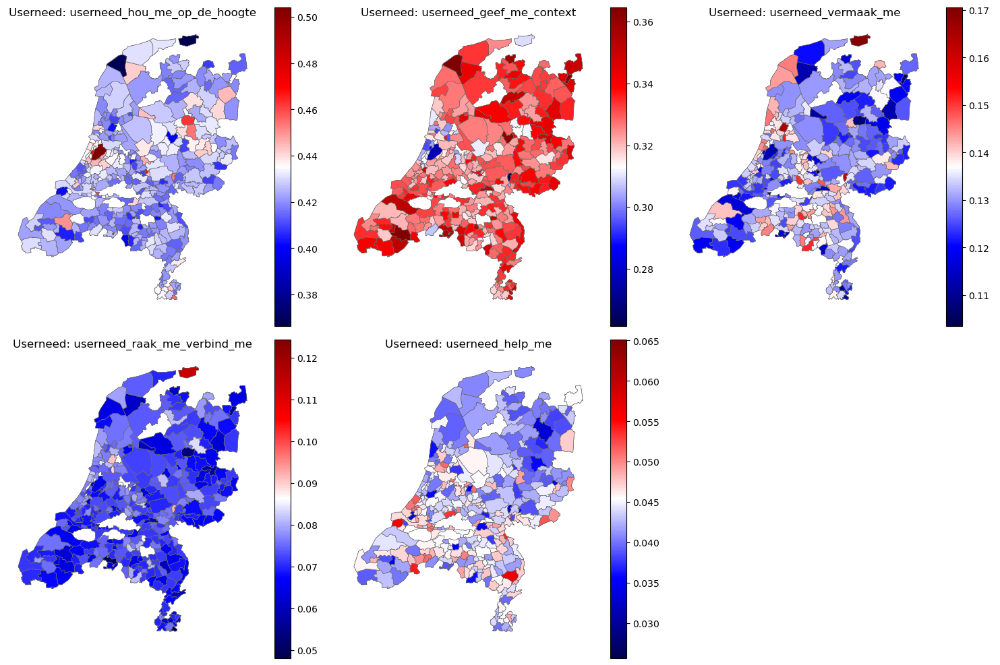

In [55]:
fig, axes = plt.subplots(2,3, figsize=(15,10))
faxes = axes.flatten()

for need, ax in zip(columns_userneeds, faxes):
    bar_info1 = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[need].min().min(), vmax=gdf_location[need].max().max()))
    bar_info1._A = []
    cbar1 = fig.colorbar(bar_info1, ax=ax)
    gdf_location.plot(column=need, cmap="seismic", linewidth=0.4, ax=ax, edgecolor=".4")
    # ax.set_xlim(0,1)
    ax.set_axis_off()
    ax.set_title(f"Userneed: {need}")
faxes[-1].set_axis_off()        
fig.tight_layout()
plt.show()


 92%|█████████▏| 12/13 [00:12<00:01,  1.00s/it]


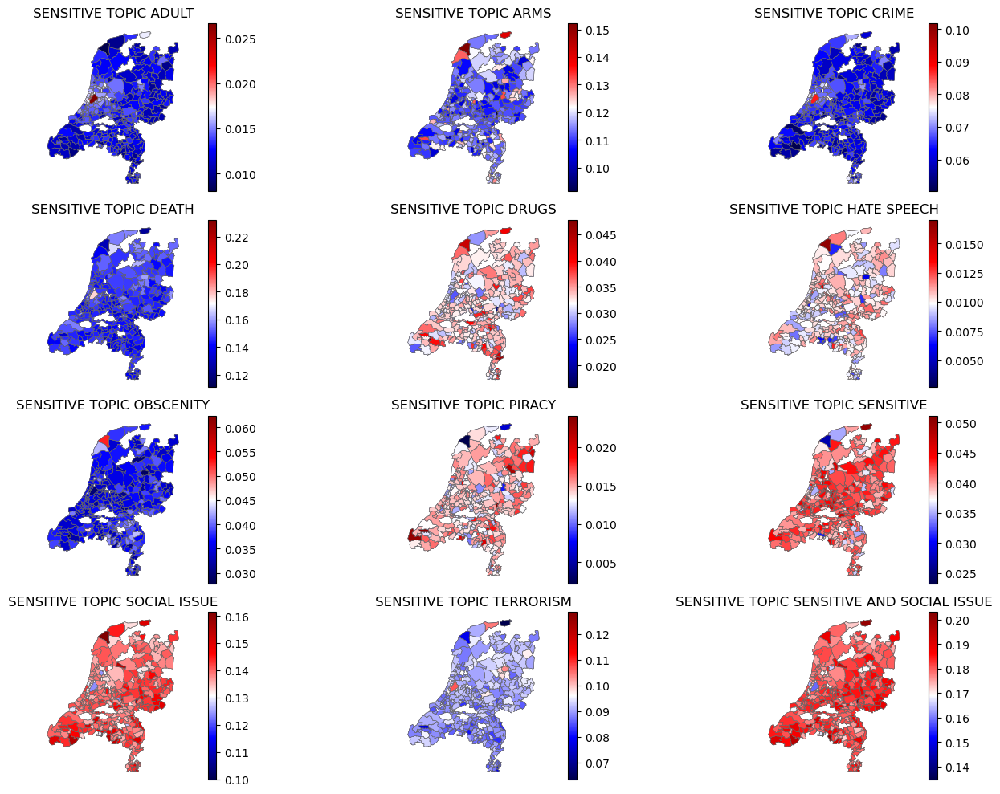

In [56]:
fig, axes = plt.subplots(4,3, figsize=(15,10))
faxes = axes.flatten()

for sensitivity, ax in tqdm.tqdm(zip(columns_sensitivity, faxes), total=len(columns_sensitivity)):
    bar_info1 = plt.cm.ScalarMappable(cmap="seismic", norm=plt.Normalize(vmin=gdf_location[sensitivity].min().min(), vmax=gdf_location[sensitivity].max().max()))
    bar_info1._A = []
    cbar1 = fig.colorbar(bar_info1, ax=ax)
    gdf_location.plot(column=sensitivity, cmap="seismic", linewidth=0.4, ax=ax, edgecolor=".4")
    # ax.set_xlim(0,1)
    ax.set_axis_off()
    ax.set_title(f"{' '.join(sensitivity.upper().split('_'))}")
faxes[-1].set_axis_off()        
fig.tight_layout()
plt.show()

# Time and Date Correlations

In [57]:
# ddf_sensitivity = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER_ARTICLES}/reduced_articles_df_fixed_set_sensitive.csv')
# columns_sensitivity = list(ddf_sensitivity.columns[ddf_sensitivity.columns.str.startswith("sensitive_")].values)
# ddf_sensitivity = ddf_sensitivity.assign(argmax_sensitivity = ddf_sensitivity[columns_sensitivity].idxmax(axis=1))
# ddf_sensitivity = ddf_sensitivity.assign(is_sensitive = ddf_sensitivity[columns_sensitivity].sum(axis=1))
# ddf_sensitivity = ddf_sensitivity.dropna(subset="sensitive_topic_terrorism")
# ddf_sensitivity = ddf_sensitivity.assign(article_sensitivity_entropy = ddf_sensitivity[columns_sensitivity].apply(lambda x: entropy(x) if x.sum()!=0 else 0, axis=1, meta='float64'))
# ddf_sensitivity = ddf_sensitivity.set_index('article_id').persist()
# ddf_sensitivity.head()

# columns_dt = list(ddf_views.columns[ddf_views.columns.str.startswith("dt_")].values)


In [58]:
columns_dt = list(ddf_views.columns[ddf_views.columns.str.startswith("dt_")].values)
ddf_time = ddf_views[["APP_ID", *columns_dt]]
# ddf_time = ddf_time.merge(ddf_topics[topic_columns])
ddf_time = ddf_time.merge(ddf_userneeds[columns_userneeds])
ddf_time = ddf_time.merge(ddf_sensitivity)
# ddf_time = ddf_time.persist()
ddf_time.head(20)

/home/bestname/anaconda3/envs/dpg/lib/python3.10/site-packages/dask/dataframe/core.py:7722: UserWarning: Insufficient elements for `head`. 20 elements requested, only 0 elements available. Try passing larger `npartitions` to `head`.
  warnings.warn(


,APP_ID,dt_hour,dt_weekday,dt_dayofmonth,dt_month,userneed_hou_me_op_de_hoogte,userneed_geef_me_context,userneed_vermaak_me,userneed_raak_me_verbind_me,userneed_help_me,...,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,file_name,argmax_sensitivity,is_sensitive,article_sensitivity_entropy
article_id,,,,,,,,,,,,,,,,,,,,,


In [59]:
ddf_time_hour = ddf_time.groupby('dt_hour').mean().compute()
ddf_time_weekday = ddf_time.groupby('dt_weekday').mean().compute()
ddf_time_month = ddf_time.groupby('dt_month').mean().compute()

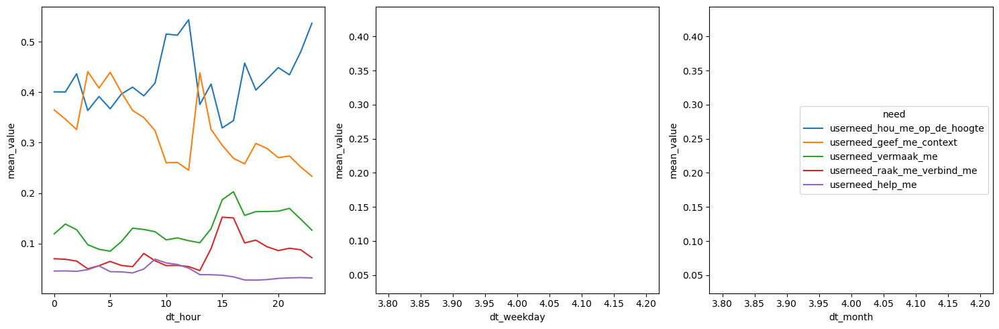

In [60]:
fig, axes = plt.subplots(1,3, figsize=(15,5), squeeze=False)
faxes = axes.flatten()
lasti = len(faxes)
for idx,(df_dt_tmp, ax) in enumerate(zip([ddf_time_hour, ddf_time_weekday, ddf_time_month], faxes)):
    # TODO: For consistency turn topic_columns to columns_topics
    tmp = df_dt_tmp.melt(value_vars=columns_userneeds, var_name="need", value_name="mean_value", ignore_index=False)
    col = tmp.index.name
    tmp = tmp.reset_index()
    sns.lineplot(data=tmp, x=col, y="mean_value", hue="need", ax=ax, legend=idx==lasti-1)
# lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
# lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
# fig.legend(lines, labels, loc = (0.5, 0), ncol=5)
fig.tight_layout()
plt.show()

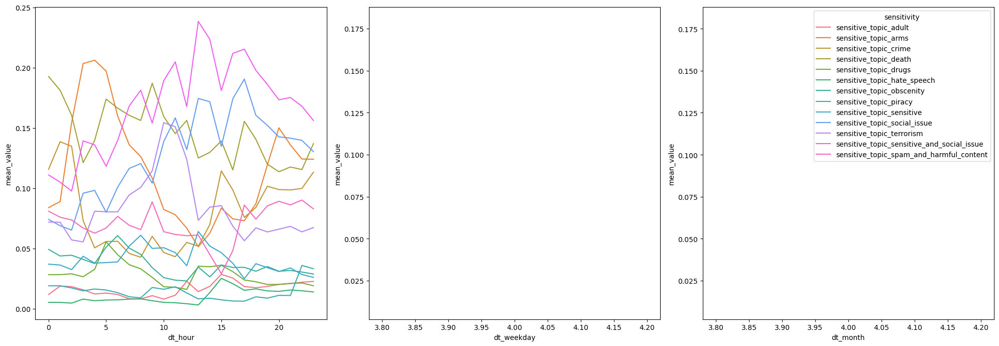

In [61]:
fig, axes = plt.subplots(1, 3, figsize=(20,7), squeeze=False)
faxes = axes.flatten()
lasti = len(faxes)
for idx,(df_dt_tmp, ax) in enumerate(zip([ddf_time_hour, ddf_time_weekday, ddf_time_month], faxes)):
    # TODO: For consistency turn topic_columns to columns_topics
    tmp = df_dt_tmp.melt(value_vars=columns_sensitivity, var_name="sensitivity", value_name="mean_value", ignore_index=False)
    col = tmp.index.name
    tmp = tmp.reset_index()
    sns.lineplot(data=tmp, x=col, y="mean_value", hue="sensitivity", ax=ax, legend=idx==lasti-1)
# lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
# lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
# fig.legend(lines, labels, loc = (0.5, 0), ncol=5)
fig.tight_layout()
plt.show()

# INTERACTION

In [62]:
DATA_FOLDER = "reduced"
ddf_interactions = dd.read_csv(f'data_dpg_testdata/{DATA_FOLDER}/reduced_interactions.csv', dtype={"ARTICLE_ID":"str"})
tmp = ddf_interactions[["ARTICLE_ID","SE_LABEL", "SE_ACTION"]].compute()
unique_interactions_1 = tmp["SE_LABEL"].unique()
unique_interactions_2 = tmp["SE_ACTION"].unique()
ddf_interactions["article_id"] = ddf_interactions["ARTICLE_ID"]
ddf_interactions = ddf_interactions.set_index('article_id')
ddf_interactions.head()

,APP_ID,ARTICLE_ID,DERIVED_TSTAMP,SE_ACTION,SE_CATEGORY,SE_LABEL,SE_VALUE,QUASI_USER_ID,IS_LOGGED_IN,GEO_CITY,...,privacy_non-personalised_ads,privacy_marketing,privacy_social_media,privacy_geo_location,privacy_advertising,file_name,GEO_COUNTRY,GEO_REGION,GEO_ZIPCODE,REFR_MEDIUM
article_id,,,,,,,,,,,,,,,,,,,,,
2108938,nu.web,2108938,2022-04-01T06:59:06.270Z,whatsapp,article-social-share-icon,top,1.0,9d8c297ed0b5189753565b17c0242ad9,1,137,...,1,1,1,0,1,0,NL,FL,1318,search
2822099,nu.web,2822099,2022-04-01T16:41:30.059Z,whatsapp,article-social-share-icon,bottom,1.0,1143e2124ee3b44d2b5b034fa84a2b36,1,125,...,1,1,1,0,1,0,NL,GE,3772,search
3728111,nu.web,3728111,2022-04-01T15:27:13.639Z,whatsapp,article-social-share-icon,bottom,1.0,d70d49207ff0115cc0179c98afa2e689,1,7,...,1,1,1,0,1,0,NL,NH,1025,NaN
3773082,nu.web,3773082,2022-04-01T14:33:33.622Z,facebook,article-social-share-icon,top,1.0,5f3017b2811a3d436f63984b5e1d774c,1,324,...,1,1,1,0,1,0,NL,NB,5431,search
4238965,nu.web,4238965,2022-04-01T18:23:47.249Z,twitter,article-social-share-icon,bottom,1.0,36ff5e0e1257a9806fb85f9dc2bff8a4,1,24,...,1,1,1,0,1,0,NL,NaN,NaN,social


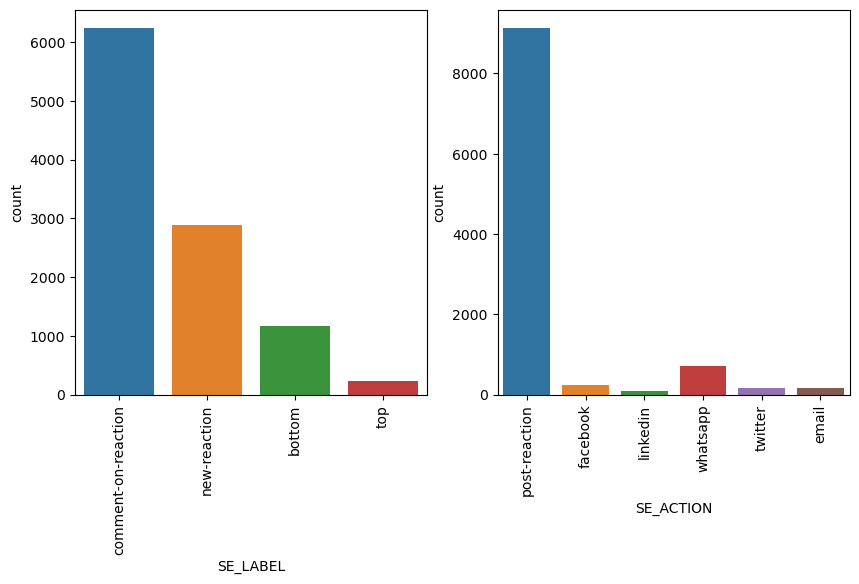

In [63]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.countplot(data=tmp, x="SE_LABEL", ax=ax[0])
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation = 90)
sns.countplot(data=tmp, x="SE_ACTION", ax=ax[1])
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation = 90)
plt.show()


In [64]:
ddf_topics_merged_interactions = ddf_topics.merge(ddf_interactions[["ARTICLE_ID", "SE_LABEL", "SE_ACTION"]], how="inner", left_on='article_id', right_on='ARTICLE_ID').persist()
display(ddf_topics_merged_interactions)


,topic_voetbal,topic_optredens_en_voorstellingen,topic_politiek,topic_technologie_en_handel,topic_relatie_en_opvoeden,topic_bestuur_en_organisatie,topic_human_interest,topic_verkeersongevallen,topic_nominatie_en_prijzen,topic_veiligheid,topic_onderwijs,topic_maatschappelijke_instellingen,topic_economie,topic_lokale_evenementen,topic_het_weer,topic_brand,topic_verkeer,topic_gezondheid_en_zorg,topic_gemeentepolitiek,topic_sport,topic_kunst_en_cultuur,topic_eten_en_drinken,topic_natuur,topic_duurzaamheid,topic_misdaad,topic_wielrennen,topic_zingeving_en_verhalen,topic_afval_en_milieuproblematiek,topic_consumeren_en_vrije_tijd,topic_overheidsbeleid,topic_vakbond_club_en_vereniging,topic_religie,topic_bouwen_en_wonen,topic_recht_en_justitie,topic_samenleving,topic_woon_en_leefomgeving,file_name,article_topic_entropy,argmax_topic,ARTICLE_ID,SE_LABEL,SE_ACTION
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2108938,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,object,object,object,object
6192854,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


4it [00:00,  9.18it/s]


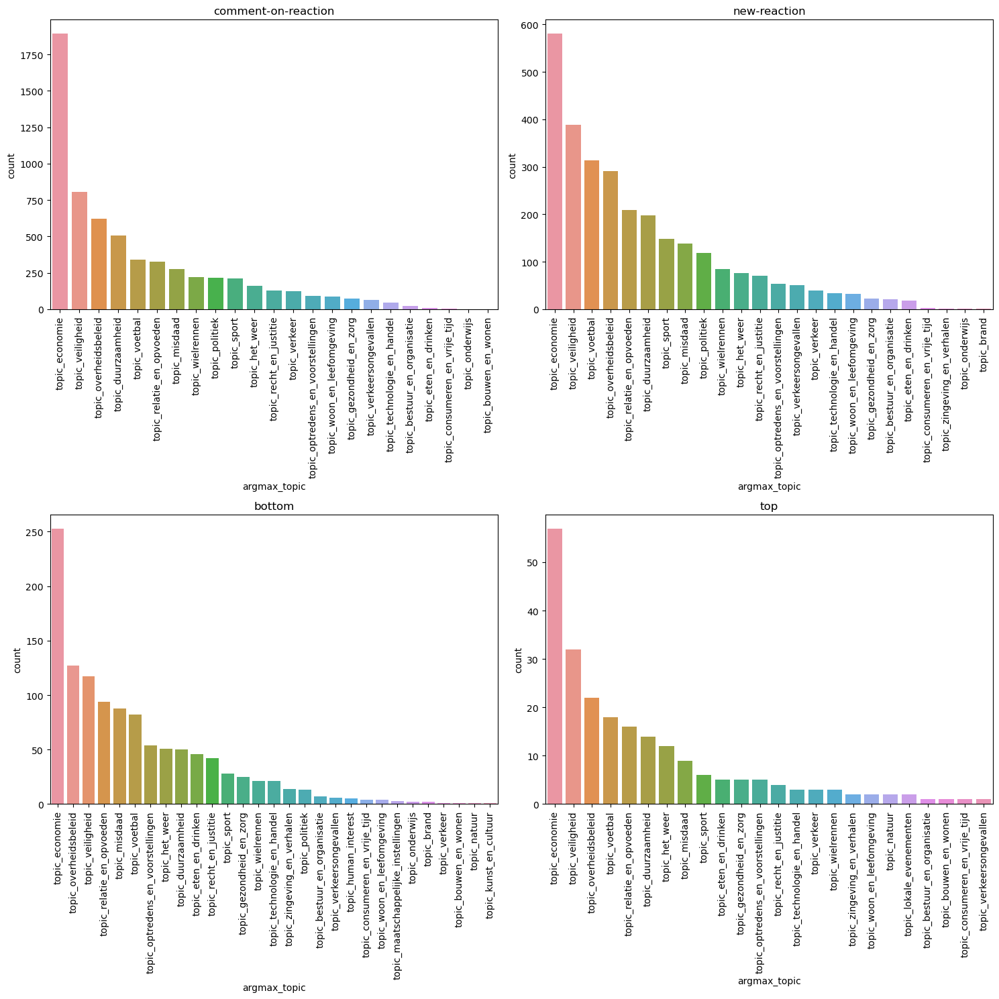

In [65]:
fig, axes = plt.subplots(2,(len(unique_interactions_1)//2), figsize=(15, 15))
faxes = axes.flatten()
tmp = ddf_topics_merged_interactions[["argmax_topic", "SE_LABEL"]].compute()
for interaction, ax in tqdm.tqdm(zip(unique_interactions_1, faxes)):
    order = tmp.loc[tmp["SE_LABEL"]==interaction]["argmax_topic"].value_counts().index
    ax = sns.countplot(data=tmp.loc[tmp["SE_LABEL"]==interaction], x="argmax_topic", ax=ax, order=order)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="center")
    ax.set_title(interaction)
fig.tight_layout()
plt.show()

6it [00:00,  9.81it/s]


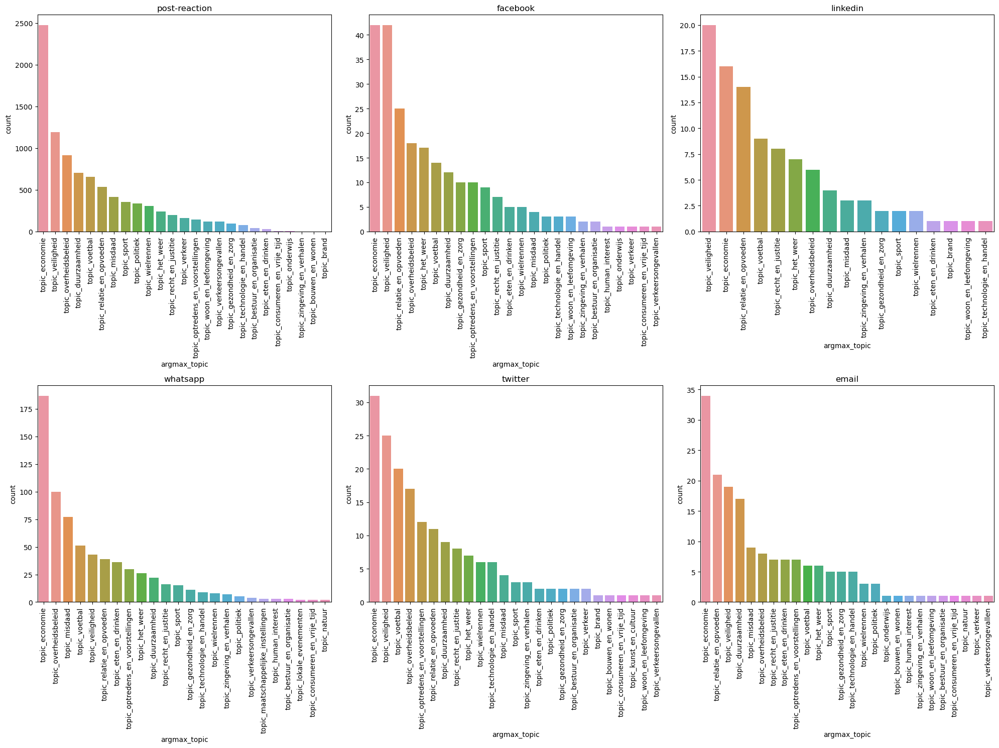

In [66]:
fig, axes = plt.subplots(2,(len(unique_interactions_2)//2), figsize=(20, 15))
faxes = axes.flatten()
tmp = ddf_topics_merged_interactions[["argmax_topic", "SE_ACTION"]].compute()
for interaction, ax in tqdm.tqdm(zip(unique_interactions_2, faxes)):
    order = tmp.loc[tmp["SE_ACTION"]==interaction]["argmax_topic"].value_counts().index
    ax = sns.countplot(data=tmp.loc[tmp["SE_ACTION"]==interaction], x="argmax_topic", ax=ax, order=order)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="center")
    ax.set_title(interaction)
fig.tight_layout()
plt.show()

In [67]:
l_test_results = list()
tmp = ddf_topics_merged_interactions.sample(frac=0.01).compute()
for topic in tqdm.tqdm(topic_columns):
    res = {"topic": topic, **pg.kruskal(data=tmp, dv=topic, between="SE_LABEL").iloc[0].to_dict()}
    l_test_results.append(res)
df_test_results = pd.DataFrame(l_test_results).sort_values("p-unc")
df_test_results

100%|██████████| 36/36 [00:00<00:00, 188.39it/s]


,topic,Source,ddof1,H,p-unc
2,topic_politiek,SE_LABEL,3,10.580891,0.014222
8,topic_nominatie_en_prijzen,SE_LABEL,3,6.021489,0.110569
18,topic_gemeentepolitiek,SE_LABEL,3,5.668717,0.128889
17,topic_gezondheid_en_zorg,SE_LABEL,3,5.638881,0.130564
21,topic_eten_en_drinken,SE_LABEL,3,5.616202,0.131851
14,topic_het_weer,SE_LABEL,3,5.545692,0.135931
12,topic_economie,SE_LABEL,3,5.039326,0.168940
27,topic_afval_en_milieuproblematiek,SE_LABEL,3,4.801044,0.186959
25,topic_wielrennen,SE_LABEL,3,4.678656,0.196898
28,topic_consumeren_en_vrije_tijd,SE_LABEL,3,4.279381,0.232834


100%|██████████| 36/36 [00:07<00:00,  4.92it/s]


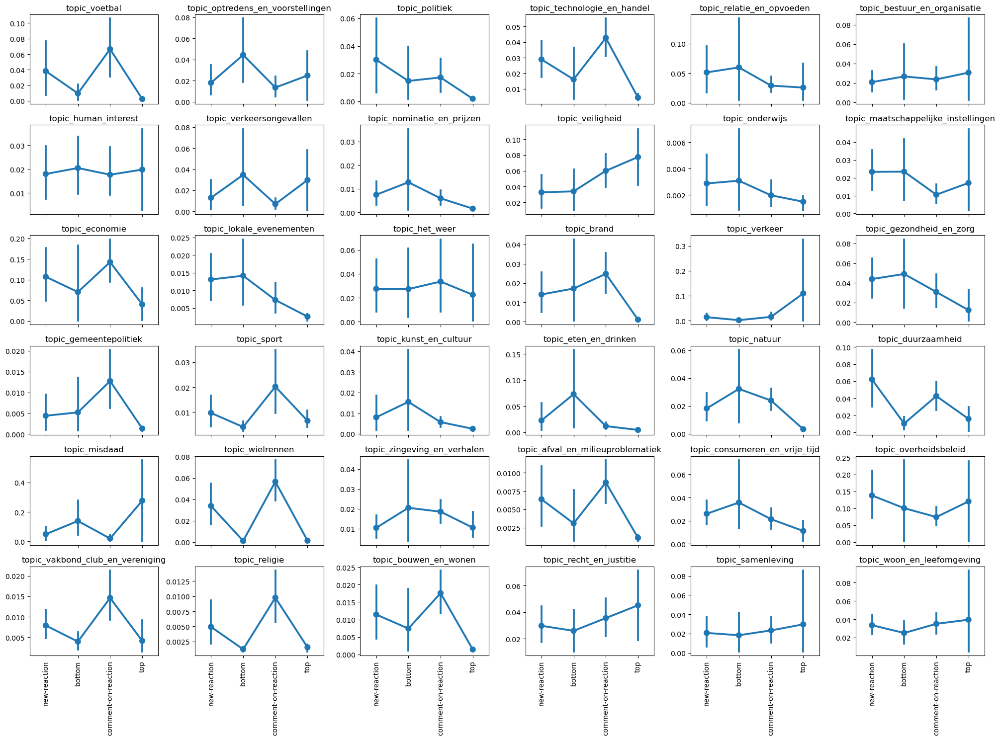

In [68]:
# TODO: Change the scale so it's not shared between the plots
fig, axes = plt.subplots(6,6,figsize=(20, 15), sharey=False, sharex=True)
faxes = axes.flatten()
tmp = ddf_topics_merged_interactions.sample(frac=0.01).compute()
for topic, ax in tqdm.tqdm(zip(topic_columns, faxes), total=len(topic_columns)):
    ax = sns.pointplot(data=tmp, x="SE_LABEL", y=topic, ax=ax)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="center")
    ax.set_title(topic)
fig.tight_layout()  
plt.show()

100%|██████████| 36/36 [00:06<00:00,  5.42it/s]


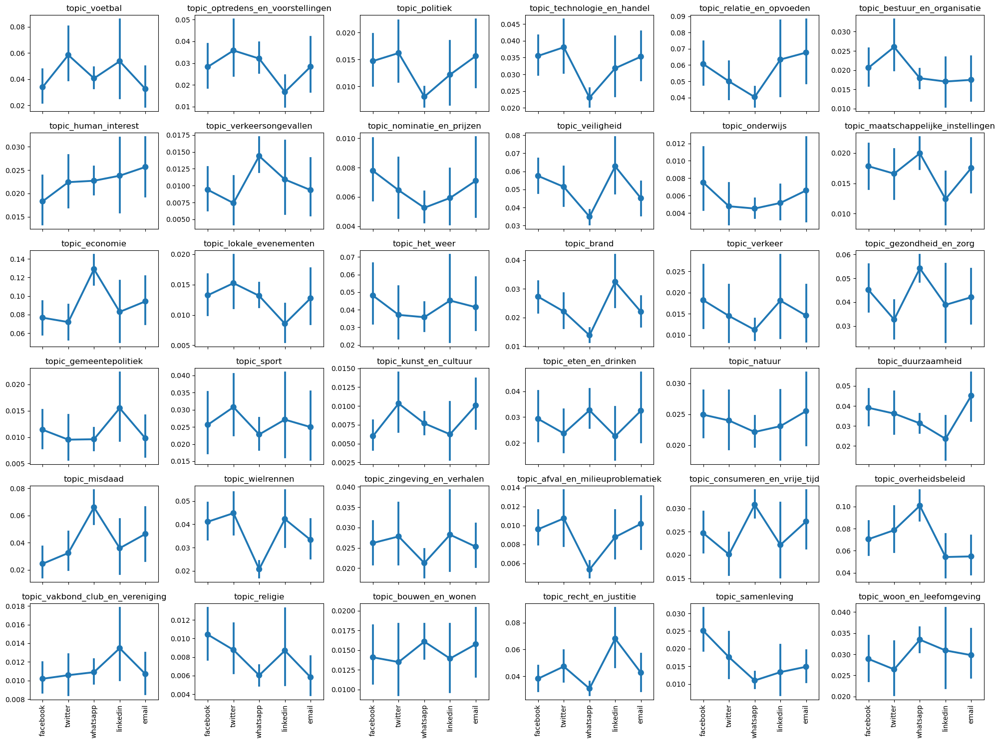

In [69]:
fig, axes = plt.subplots(6,6,figsize=(20, 15), sharey=False, sharex=True)
faxes = axes.flatten()
tmp = ddf_topics_merged_interactions[ddf_topics_merged_interactions["SE_ACTION"] != "post-reaction"].sample(frac=1).compute()
for topic, ax in tqdm.tqdm(zip(topic_columns, faxes), total=len(topic_columns)):
    ax = sns.pointplot(data=tmp, x="SE_ACTION", y=topic, ax=ax)
    ax.set_ylabel(None)
    ax.set_xlabel(None)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, ha="center")
    ax.set_title(topic)
fig.tight_layout()  
plt.show()

In [70]:
ddf_interaction_sensitivity_merge = ddf_interactions.merge(ddf_sensitivity)
ddf_interaction_sensitivity_merge

,APP_ID,ARTICLE_ID,DERIVED_TSTAMP,SE_ACTION,SE_CATEGORY,SE_LABEL,SE_VALUE,QUASI_USER_ID,IS_LOGGED_IN,GEO_CITY,REFR_URLHOST,privacy_functional,privacy_analytics,privacy_target_advertising,privacy_personalisation,privacy_non-personalised_ads,privacy_marketing,privacy_social_media,privacy_geo_location,privacy_advertising,file_name,GEO_COUNTRY,GEO_REGION,GEO_ZIPCODE,REFR_MEDIUM,sensitive_topic_adult,sensitive_topic_arms,sensitive_topic_crime,sensitive_topic_death,sensitive_topic_drugs,sensitive_topic_hate_speech,sensitive_topic_obscenity,sensitive_topic_piracy,sensitive_topic_sensitive,sensitive_topic_social_issue,sensitive_topic_terrorism,sensitive_topic_sensitive_and_social_issue,sensitive_topic_spam_and_harmful_content,argmax_sensitivity,is_sensitive,article_sensitivity_entropy
npartitions=1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,object,object,object,object,object,object,float64,object,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,object,object,object,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,float64
,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [71]:
# fig, (ax1,ax2) = plt.subplots(2,1, figsize=(15, 15))
# tmp = ddf_interaction_sensitivity_merge[["SE_LABEL","is_sensitive"]].groupby("SE_LABEL").sum().compute().reset_index()
# sns.barplot(data=tmp, x="SE_LABEL", y="is_sensitive", ax=ax1)
# fig.tight_layout()
# plt.show()